In [800]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns
import statsmodels.api as sm

from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.vector_ar.vecm import coint_johansen #Johansen Cointegration test

## Loading and Inspecting Dataset

In [801]:
# upload dataset
data = pd.read_csv("train.csv")
data_store = pd.read_csv("store.csv")

In [802]:
df = pd.DataFrame(data)
df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1


In [803]:
# modify date format
df['Date'] = pd.to_datetime(df.Date)
df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1


In [804]:
# sort date to bring oldest first
df= df.sort_values(by= ['Date','Store'])
df= df.reset_index(drop= True)
df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,2,2013-01-01,0,0,0,0,a,1
1,2,2,2013-01-01,0,0,0,0,a,1
2,3,2,2013-01-01,0,0,0,0,a,1
3,4,2,2013-01-01,0,0,0,0,a,1
4,5,2,2013-01-01,0,0,0,0,a,1


In [805]:
# inspect data type
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1017209 entries, 0 to 1017208
Data columns (total 9 columns):
 #   Column         Non-Null Count    Dtype         
---  ------         --------------    -----         
 0   Store          1017209 non-null  int64         
 1   DayOfWeek      1017209 non-null  int64         
 2   Date           1017209 non-null  datetime64[ns]
 3   Sales          1017209 non-null  int64         
 4   Customers      1017209 non-null  int64         
 5   Open           1017209 non-null  int64         
 6   Promo          1017209 non-null  int64         
 7   StateHoliday   1017209 non-null  object        
 8   SchoolHoliday  1017209 non-null  int64         
dtypes: datetime64[ns](1), int64(7), object(1)
memory usage: 69.8+ MB


#### filter stores - 1,3,8,9,13,25,29,31 and 46

In [806]:
stores = [1,3,8,9,13,25,29,31,46]
df = df[df.Store.isin(stores)]
df.head(9)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,2,2013-01-01,0,0,0,0,a,1
2,3,2,2013-01-01,0,0,0,0,a,1
7,8,2,2013-01-01,0,0,0,0,a,1
8,9,2,2013-01-01,0,0,0,0,a,1
12,13,2,2013-01-01,0,0,0,0,a,1
24,25,2,2013-01-01,0,0,0,0,a,1
28,29,2,2013-01-01,0,0,0,0,a,1
30,31,2,2013-01-01,0,0,0,0,a,1
45,46,2,2013-01-01,0,0,0,0,a,1


In [807]:
# inspecting number of rows per store
df.Store.value_counts().sort_index()

1     942
3     942
8     942
9     942
13    758
25    942
29    942
31    942
46    758
Name: Store, dtype: int64

#### Inspect data store wise

In [808]:
df.loc[df['Store']==1].head(21)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,2,2013-01-01,0,0,0,0,a,1
1114,1,3,2013-01-02,5530,668,1,0,0,1
2229,1,4,2013-01-03,4327,578,1,0,0,1
3344,1,5,2013-01-04,4486,619,1,0,0,1
4459,1,6,2013-01-05,4997,635,1,0,0,1
5574,1,7,2013-01-06,0,0,0,0,0,1
6689,1,1,2013-01-07,7176,785,1,1,0,1
7804,1,2,2013-01-08,5580,654,1,1,0,1
8919,1,3,2013-01-09,5471,626,1,1,0,1
10034,1,4,2013-01-10,4892,615,1,1,0,1


Observation :
- Every 7th day the week, sales is zero . As we can see coresponding open column is also zero.
- It implies store is closed on every 7th day.
- Lets drop these rows and rearrange the date column , so that no date has zero sales.
- it was exactly same thing done in given dataset named "inputDataProcessed" for stores 1 to 15, But here we are looking for specific stores , so we will prepare our dataset in same way.

In [809]:
# drop rows with Shop is closed (open value 0) or Sales is zero.
df = df.loc[~(df['Sales']==0)]

# evaluate the number of rows left in each store
df.Store.value_counts().sort_index()

1     781
3     779
8     784
9     779
13    621
25    750
29    779
31    784
46    622
Name: Store, dtype: int64

In [810]:
# inspect any rows with Sales value as 0
df[df['Sales']==0]

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday


#### Inspecting missing value

In [811]:
df.isnull().sum()

Store            0
DayOfWeek        0
Date             0
Sales            0
Customers        0
Open             0
Promo            0
StateHoliday     0
SchoolHoliday    0
dtype: int64

Observation:
- No missing value in data

In [812]:
df.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
count,6679.000000,6679.000000,6679.000000,6679.000000,6679.0,6679.000000,6679.000000
mean,17.776763,3.506064,6549.722414,716.810600,1.0,0.447971,0.193292
std,13.999680,1.712728,2632.977121,353.300394,0.0,0.497323,0.394910
min,1.000000,1.000000,1410.000000,194.000000,1.0,0.000000,0.000000
25%,8.000000,2.000000,4740.500000,517.000000,1.0,0.000000,0.000000
50%,13.000000,3.000000,5921.000000,619.000000,1.0,0.000000,0.000000
75%,29.000000,5.000000,7829.500000,765.500000,1.0,1.000000,0.000000
max,46.000000,6.000000,24882.000000,2835.000000,1.0,1.000000,1.000000


#### Grouping the data store wise 

In [813]:
store_df = []

    
for i in stores:
    store_df.append(df[df['Store'] == i])
  


for temp_df in store_df:
    temp_df['Date'] = pd.date_range(start = '2013-01-01', periods = len(temp_df), freq= 'D') # resequencing the date column, 
                                                                                             # as some date are missing due to dropping of rows
    temp_df.drop('Open',axis = 1,inplace = True) # now we have all stores open , there is only one value in Open column, so drop it.

for temp_df in store_df:
    print(temp_df.head(10))

       Store  DayOfWeek       Date  ...  Promo  StateHoliday  SchoolHoliday
1114       1          3 2013-01-01  ...      0             0              1
2229       1          4 2013-01-02  ...      0             0              1
3344       1          5 2013-01-03  ...      0             0              1
4459       1          6 2013-01-04  ...      0             0              1
6689       1          1 2013-01-05  ...      1             0              1
7804       1          2 2013-01-06  ...      1             0              1
8919       1          3 2013-01-07  ...      1             0              1
10034      1          4 2013-01-08  ...      1             0              1
11149      1          5 2013-01-09  ...      1             0              1
12264      1          6 2013-01-10  ...      0             0              0

[10 rows x 8 columns]
       Store  DayOfWeek       Date  ...  Promo  StateHoliday  SchoolHoliday
1116       3          3 2013-01-01  ...      0             0     

Observation :
- No more rows with zero Sales value.
- Date are in continuity.

In [814]:
# A new list named store_tsdf,  saves time series dataframe with Date columns as index



store_tsdf = []
for i in range(len(store_df)):
    store_df[i]['Date'] = pd.to_datetime(store_df[i]['Date'],format = "%Y-%m-%d")
    store_tsdf.append(pd.DataFrame(store_df[i][['Date','Store','Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']]).set_index('Date'))

store_tsdf[0].head()

,Store,Sales,Customers,DayOfWeek,Promo,SchoolHoliday,StateHoliday
Date,,,,,,,
2013-01-01,1,5530,668,3,0,1,0
2013-01-02,1,4327,578,4,0,1,0
2013-01-03,1,4486,619,5,0,1,0
2013-01-04,1,4997,635,6,0,1,0
2013-01-05,1,7176,785,1,1,1,0


## EDA

### Comparing different Stores

In [815]:
# merge two dataframe 
merged_df = pd.merge(data,data_store, on = 'Store', how = 'inner')
merged_df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
2,1,3,2015-07-29,4782,523,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
3,1,2,2015-07-28,5011,560,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
4,1,1,2015-07-27,6102,612,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN


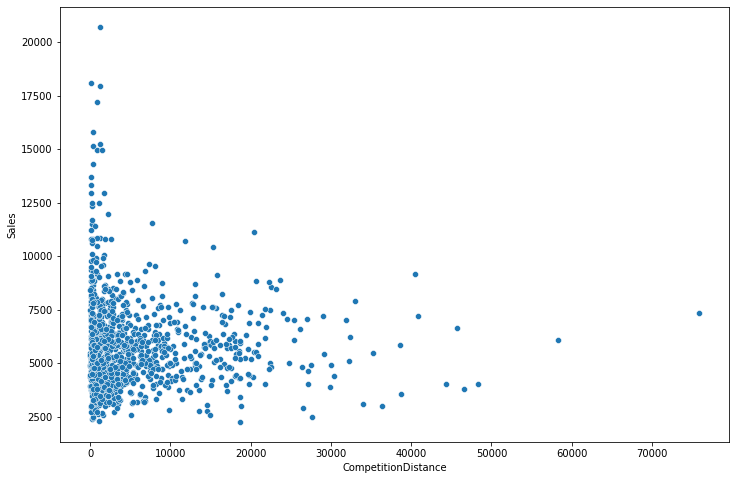

In [816]:
# group dataset Store wise comparing Sales and Competition distance
grouped_df_compdist = merged_df.groupby('Store')[['Sales','CompetitionDistance']].mean()


# Analysing how competition distance impacting Sales
sns.scatterplot(grouped_df_compdist['CompetitionDistance'],grouped_df_compdist['Sales'])
plt.show()

Observation:
- There is not much impact of competition distance on Sales.
- The maximum sales has very close competitior.


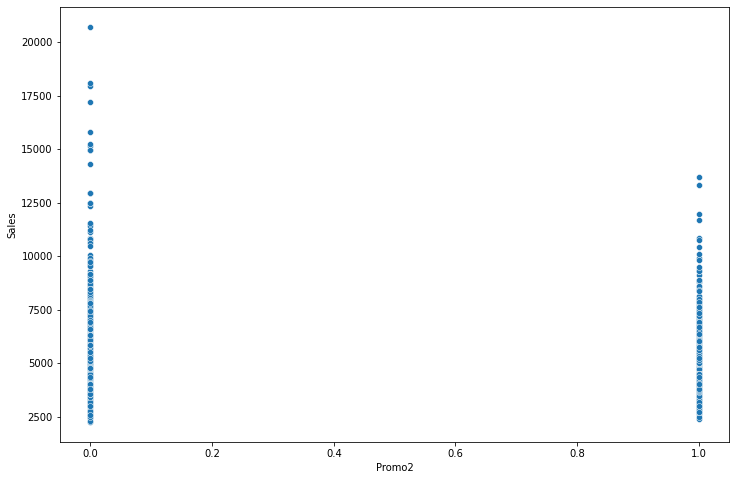

In [817]:
# Analysing the Sales and Promo2 for different stores
grouped_df_promo2 = merged_df.groupby('Store')[['Sales','Promo2']].mean()
sns.scatterplot(grouped_df_promo2['Promo2'],grouped_df_promo2['Sales'])
plt.show()

Observation:
- We can see that most of the stores have higher sales even the promotion is not continued.

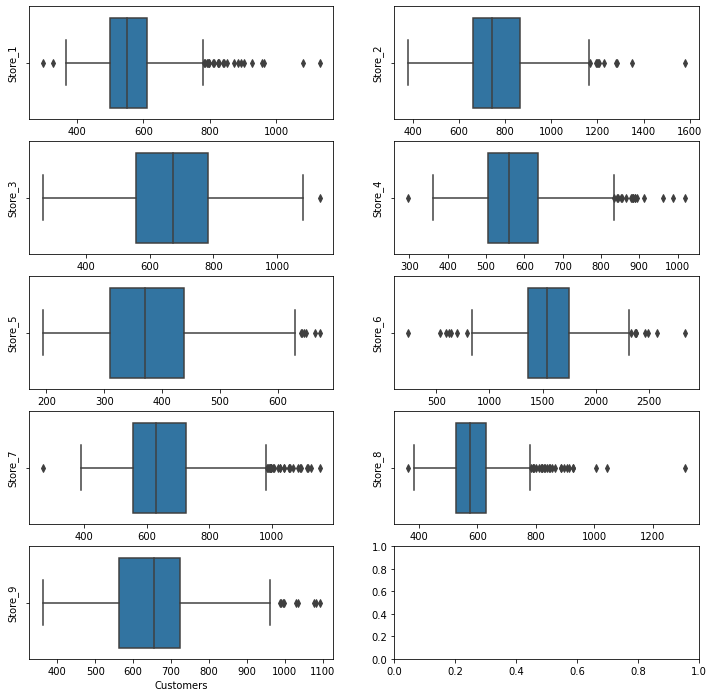

In [818]:
# Spread of Sales of all store
fig, axs = plt.subplots(figsize=(12, 12),nrows=5,ncols=2)
for i in range(9):
  axs[np.floor(i/2).astype('int')][i%2].set_ylabel("Store_"+str(i+1))
  sns.boxplot(x=store_tsdf[i]['Customers'],whis=1.5, ax= axs[np.floor(i/2).astype('int')][i%2] )
plt.show()

In [819]:
 # capping to 0.99th percentile
for i in range(9):
  store_tsdf[i].loc[store_tsdf[i]['Sales'] > store_tsdf[i]['Sales'].quantile(0.99),'Sales']= store_tsdf[i]['Sales'].quantile(0.99)

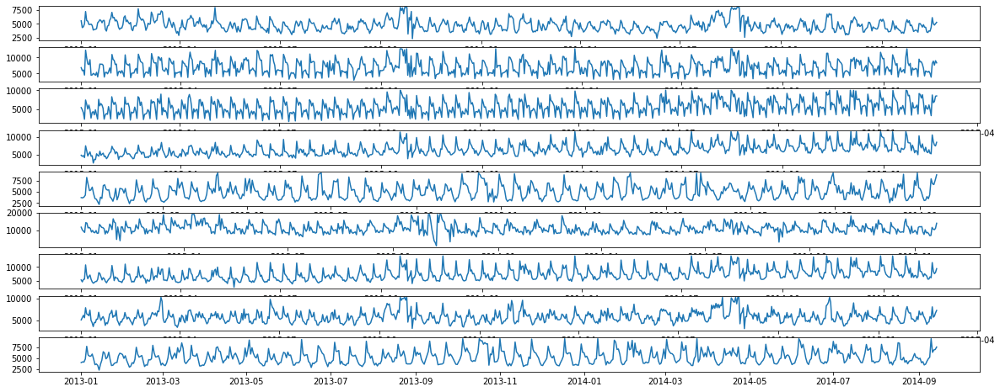

In [820]:
# Sales plot for all stores
plt.figure(figsize= [20,8]) 
plt.xlabel("Date")
plt.ylabel("Sales")
for i in range(9):
  plt.subplot(9,1,i+1)
  plt.plot(store_tsdf[i]['Sales'])
plt.show()


Observation:
- More or less all Stores have no trend.

## Define common method : graph and grangers_causality_matrix

In [821]:
def graph(y_hat, method_name):
    plt.figure(figsize=(20,4))
    plt.plot(train['Sales'], label = 'train')
    plt.plot(test['Sales'], label = 'test')
    plt.plot(y_hat, label = 'forecast')
    plt.legend(loc = 'best')
    plt.title(method_name)
    plt.show()

#### Granger Causality Test 

In [822]:
from statsmodels.tsa.stattools  import grangercausalitytests

def grangers_causality_matrix(X_train, variables,maxlag = 12, test = 'ssr_chi2test', verbose=False):
  dataset = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
  for c in dataset.columns:
    for r in dataset.index:
      test_result = grangercausalitytests(X_train[[r,c]], maxlag=maxlag, verbose=False)
      p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
      if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
      min_p_value = np.min(p_values)
      dataset.loc[r,c] = min_p_value
  dataset.columns = [var + '_x' for var in variables]
  dataset.index = [var + '_y' for var in variables]
  return dataset

#grangers_causality_matrix(dataset, variables = dataset.columns)

In [823]:
# A common result dataframe for all models. 
 
results = pd.DataFrame({'Method':[], 'MAPE': [], 'RMSE': []})
results

,Method,MAPE,RMSE


## EDA, Model Building and Forecasting for Store 1

### EDA : Store wise analysis

<Figure size 1440x288 with 0 Axes>

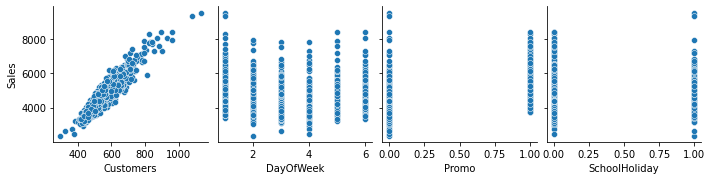

In [824]:
# Analysis relation between sales and other variables
plt.figure(figsize= [20,4])

sns.pairplot(store_df[0], x_vars= ['Customers','DayOfWeek', 'Promo', 'SchoolHoliday'],y_vars = ["Sales"],)

plt.show()
  

Observation:
- A strong relation can be seen between Sales and Customers
- Tower of Sales are  higher on weekend compare to weekdays.
- Minimum value of sale is higher when promotion is done.

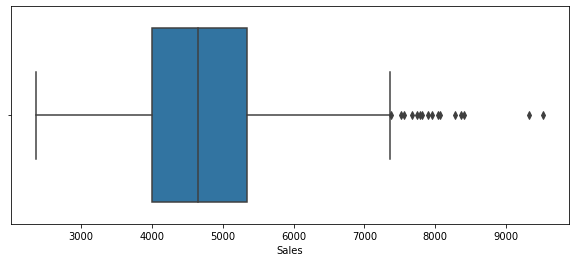

In [825]:
 # Analyse spread of Sales

plt.figure(figsize= [10,4])
sns.boxplot(store_df[0]['Sales'])
 
plt.show()

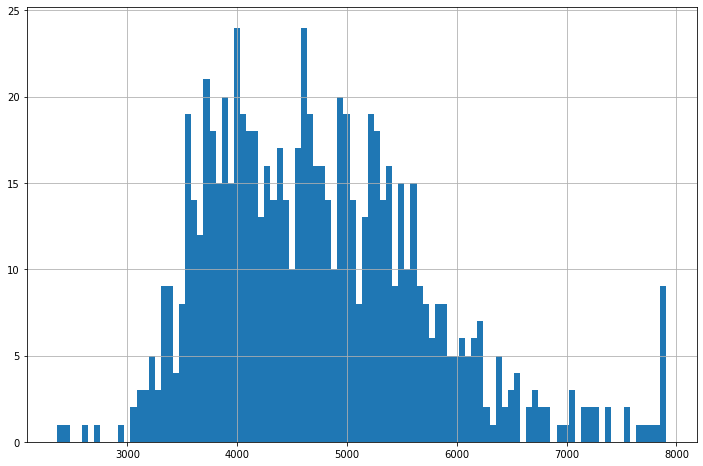

In [826]:
# distribution of Sales density 
store_tsdf[0]['Sales'].hist(bins= 100)
plt.show()

Observation:
- Most of the sales value lies between 3000 to 6000.
- Sales peak are at 4000 and 4600 around. 

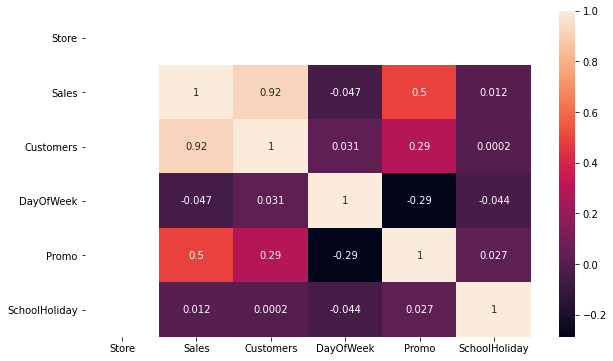

In [827]:
# analyse correlation

plt.figure(figsize=[10,6])
sns.heatmap(store_tsdf[0].corr(),annot=True)
plt.show()

Obsevation:
- Very high correlation between Sales and Customers
- Good correlation between Promo and Sales.

#### Decompostion of time series Data 

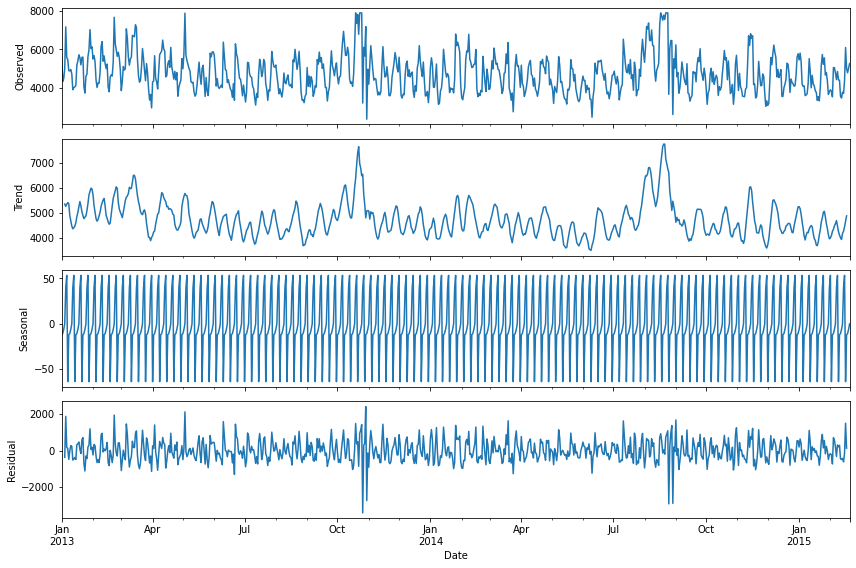

In [828]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize']  =12,8
decomposition = sm.tsa.seasonal_decompose(store_tsdf[0]['Sales'],model = 'additive')
fig = decomposition.plot()
plt.show()

### Data preparation

#### Split the time series data into test and train

In [829]:
# first two and half years as training set
# last six weeks as test set (means 42 days)
len(store_tsdf[0])

781

In [830]:

train = store_tsdf[0][['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][:-42]
test = store_tsdf[0][['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][-42:]

In [831]:
# inspect test and train 
len(train), len(test)

(739, 42)

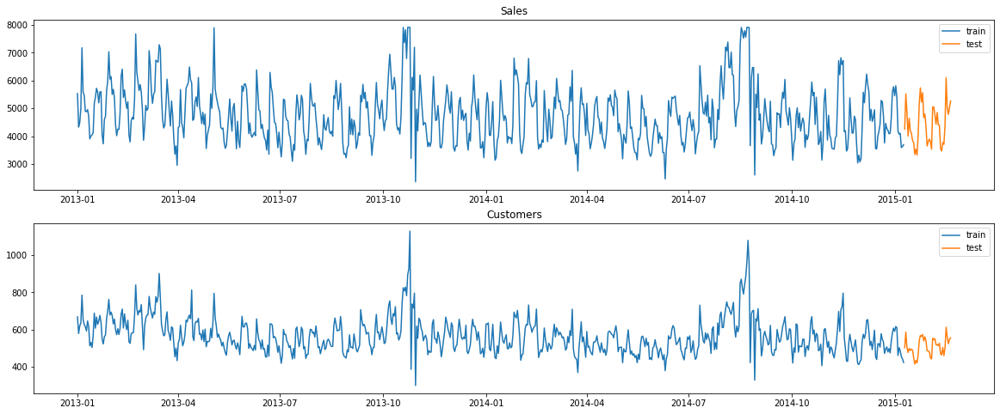

In [832]:
plt.figure(figsize = (20,8))
plt.subplot(211)
plt.plot(train['Sales'],label = 'train')
plt.plot(test['Sales'], label = 'test')
plt.title('Sales')
plt.legend(loc = 'best')

plt.subplot(212)
plt.plot(train['Customers'],label = 'train')
plt.plot(test['Customers'],label = 'test')
plt.title('Customers')
plt.legend(loc = 'best')
plt.show()

#### Standardize the train data

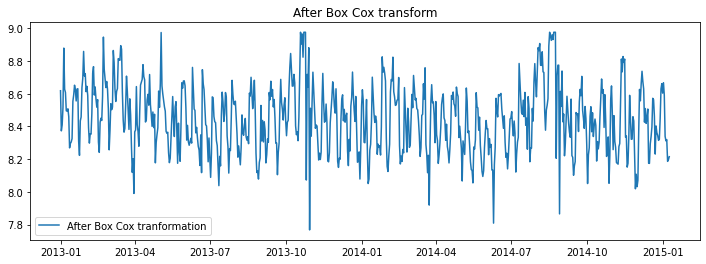

In [833]:
from scipy.stats import boxcox
train_boxcox = pd.DataFrame(boxcox(train['Sales'], lmbda=0), index = train.index, columns=['Sales'])
train_boxcox['Customers'] =  pd.Series(boxcox(train['Customers'], lmbda=0), index = train.index)

# plotting Sales after boxcox transformation
plt.figure(figsize=(12,4))
plt.plot(train_boxcox['Sales'], label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

#### Check for Stationarity

In [834]:
# Augmented Dickey Fuller test(ADF)
from statsmodels.tsa.stattools import adfuller

# Sales
adf_test = adfuller(train['Sales'])

print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])


ADF Test for SALES
ADF Statistics: -5.323
Critical value @ 0.05: -2.87
p-value: 0.000005


ADF Test for CUSTOMERS
ADF Statistics: -4.239
Critical value @ 0.05: -2.87
p-value: 0.000566


In [835]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test
from statsmodels.tsa.stattools import kpss
kpss_test = kpss(train['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

kpss_test = kpss(train['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 0.197588
Critical Values @ 0.05: 0.46
p-value: 0.100000


KPSS test for Customers
KPSS Statistic: 0.441874
Critical Values @ 0.05: 0.46
p-value: 0.059106


Observation:
- Training dataset is stationary

### Model Building

#### AutoCorrelation function

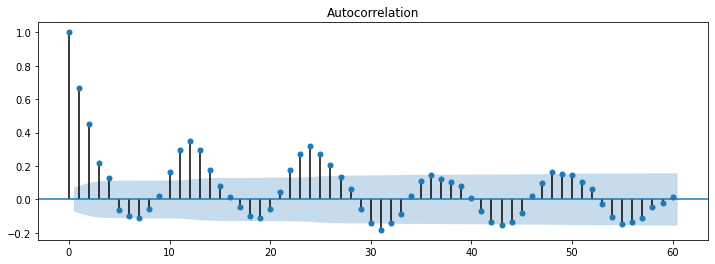

In [836]:
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12,4))
plot_acf(train_boxcox['Sales'], ax=plt.gca(), lags = 60)
plt.show()

#### Partial AutoCorrelation function.

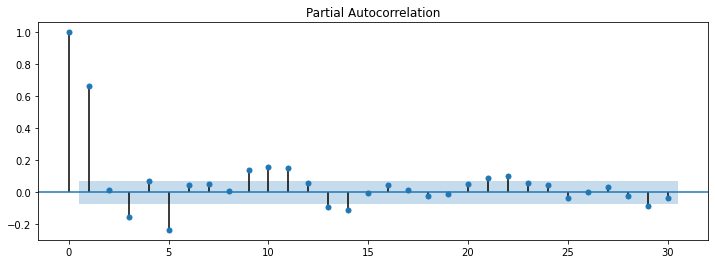

In [837]:
from statsmodels.graphics.tsaplots import plot_pacf
plt.figure(figsize=(12,4))
plot_pacf(train_boxcox['Sales'], ax=plt.gca(), lags = 30)
plt.show()

#### ARIMA MODEL

In [838]:
model = ARIMA(train_boxcox['Sales'], order=(5, 0, 4))
model_fit = model.fit()
print(model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  739
Model:                     ARMA(5, 4)   Log Likelihood                 392.157
Method:                       css-mle   S.D. of innovations              0.142
Date:                Mon, 12 Apr 2021   AIC                           -762.314
Time:                        17:02:26   BIC                           -711.656
Sample:                    01-01-2013   HQIC                          -742.781
                         - 01-09-2015                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           8.4498      0.013    643.656      0.000       8.424       8.476
ar.L1.Sales     1.0561      0.114      9.302      0.000       0.834       1.279
ar.L2.Sales     0.4142      0.198      2.088    

##### Recover the orginal time series

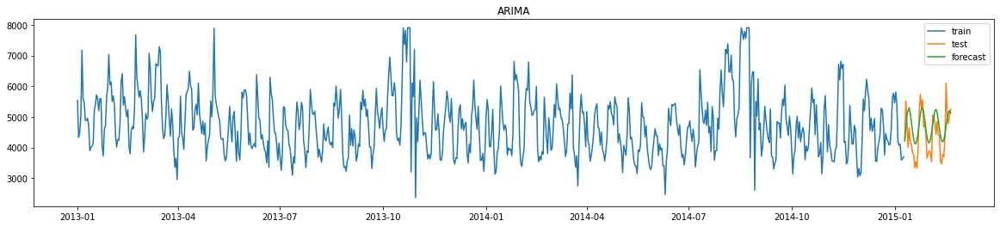

In [839]:
y_hat_ar = store_tsdf[0]['Sales'].copy()
y_hat_ar['ar_forecast_boxcox'] = model_fit.predict(start = test.index.min(), end = test.index.max())
y_hat_ar['ar_forecast'] = np.exp(y_hat_ar['ar_forecast_boxcox'])

graph(y_hat_ar['ar_forecast'],"ARIMA")

##### Calculate RMSE and MAPE

In [840]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_ar['ar_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_ar['ar_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_1_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71


#### Check for granger Causality Test

In [841]:
grangers_causality_matrix(train,variables = train.columns)

,Sales_x,Customers_x,DayOfWeek_x,Promo_x,SchoolHoliday_x,StateHoliday_x
Sales_y,1.0000,0.0000,0.0000,0.00,0.0005,1.0
Customers_y,0.0000,1.0000,0.0000,0.00,0.0001,1.0
DayOfWeek_y,0.0000,0.0000,1.0000,0.00,0.0000,1.0
Promo_y,0.0000,0.0000,0.0000,1.00,0.0011,1.0
SchoolHoliday_y,0.0043,0.0036,0.0001,0.02,1.0000,1.0
StateHoliday_y,NaN,NaN,NaN,NaN,NaN,NaN


#### VAR model

In [842]:

mod = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']], order=(1,0), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  739
Model:                             VAR(1)   Log Likelihood                1400.071
Date:                    Mon, 12 Apr 2021   AIC                          -2786.142
Time:                            17:02:31   BIC                          -2753.905
Sample:                        01-01-2013   HQIC                         -2773.712
                             - 01-09-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              243.84, 177.13   Jarque-Bera (JB):       1403.15, 73.67
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.36, 1.17   Skew:                      -0.46, 0.07
Prob(H) (two-sided):            0.02, 0.21   Kurtosis:                   9.69, 4.54


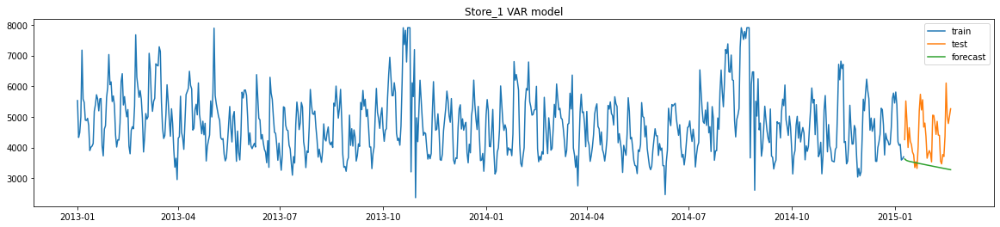

In [843]:
# forecast
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_var = mod.fit().predict(start=start_index, end=end_index)
y_hat_var = np.exp(y_hat_var)
graph(y_hat_var['Sales'],"Store_1 VAR model")


In [844]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'])).round(2)
#print('Income: RMSE:',  rmse)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_var['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_1_VAR'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results



,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40


#### Johansen cointegration Test

In [845]:
coint=coint_johansen(np.asarray(train_boxcox[['Sales','Customers']]),0,1)
# coint.trace_stat
# coint.max_eig_stat
traces = coint.lr1
maxeig=coint.lr2
cvts = coint.cvt  ## 0: 90%  1:95% 2: 99%
cvms = coint.cvm   ## 0: 90%  1:95% 2: 99%

N, l = np.asarray(train[['Sales','Customers']]).shape

for i in range(l):
    if traces[i] > cvts[i, 1]:
        r = i + 1
print(r)

2


Observation:
- No cointgeration
- Both series are stationary

#### VARMAX

In [846]:
exog = train['SchoolHoliday']
mod_varmax = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']],exog= exog, order=(4,0), trend='c')
resmax = mod_varmax.fit(maxiter=1000, disp=False)
print(resmax.summary())

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  739
Model:                            VARX(4)   Log Likelihood                1543.082
                              + intercept   AIC                          -3040.164
Date:                    Mon, 12 Apr 2021   BIC                          -2934.242
Time:                            17:02:39   HQIC                         -2999.322
Sample:                        01-01-2013                                         
                             - 01-09-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               170.92, 57.77   Jarque-Bera (JB):       313.54, 149.69
Prob(Q):                        0.00, 0.03   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.26, 1.35   Skew:                      -0.32, 0.05
P

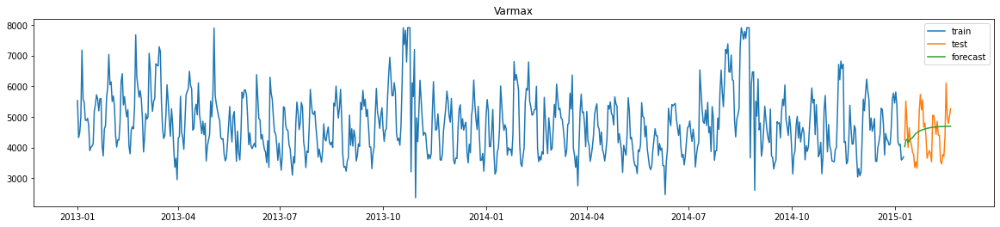

In [847]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
#y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = exog[-42:])
y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)
graph(y_hat_varmax['Sales'],"Varmax")


In [848]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'])).round(2)
#print('Income: RMSE:',  rmse)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_varmax['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_1_VARMAX_SchoolHoliday'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53


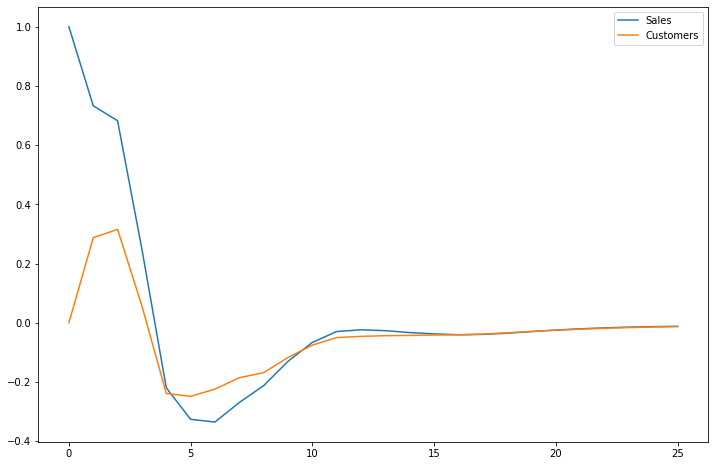

In [849]:
irf = resmax.impulse_responses(steps = 25, orthogonalized= False)
irf.plot()

## EDA, Model Building and Forecasting for Store 3

### EDA : Store wise analysis

<Figure size 1440x288 with 0 Axes>

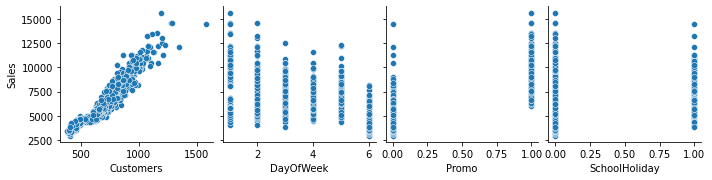

In [850]:
# Analysis relation between sales and variables
plt.figure(figsize= [20,4])

sns.pairplot(store_df[1], x_vars= ['Customers','DayOfWeek', 'Promo', 'SchoolHoliday'],y_vars = ["Sales"],)

plt.show()
  

Observation:
- A strong relation can be seen between Sales and Customers
- Tower of Sales goes down with weekdays.
- Minimum value of sale is higher when promotion is done.

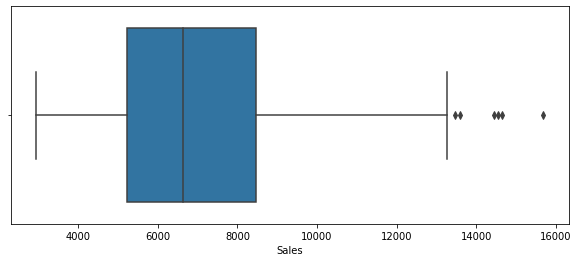

In [851]:
 # Analyse spread of Sales

plt.figure(figsize= [10,4])
sns.boxplot(store_df[1]['Sales'])
 
plt.show()

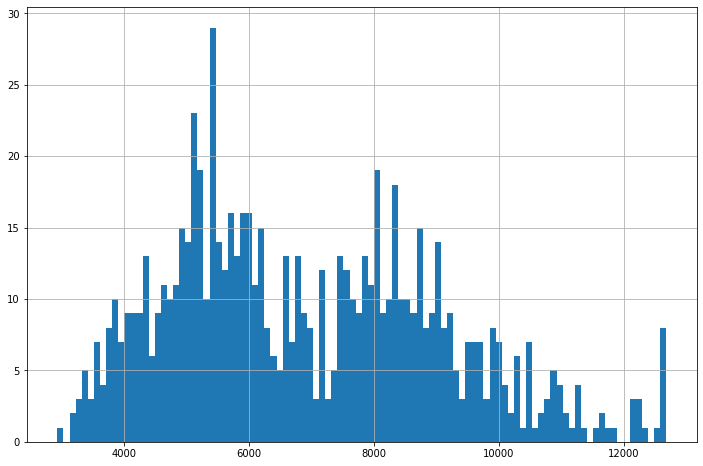

In [852]:
# distribution of Sales density 
store_tsdf[1]['Sales'].hist(bins= 100)
plt.show()

Observation:
- Most of the sales value lies between 4000 to 10000.
- Sales peak are at 5000 and 8000 around. 

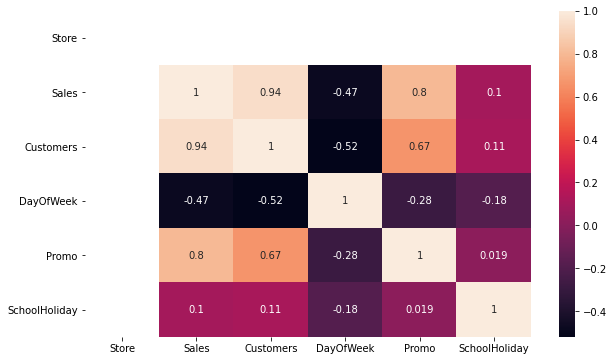

In [853]:
# analyse correlation

plt.figure(figsize=[10,6])
sns.heatmap(store_tsdf[1].corr(),annot=True)
plt.show()

Obsevation:
- Very high correlation between Sales and Customers
- Good correlation between Promo and Sales.

#### Decompostion of time series Data 

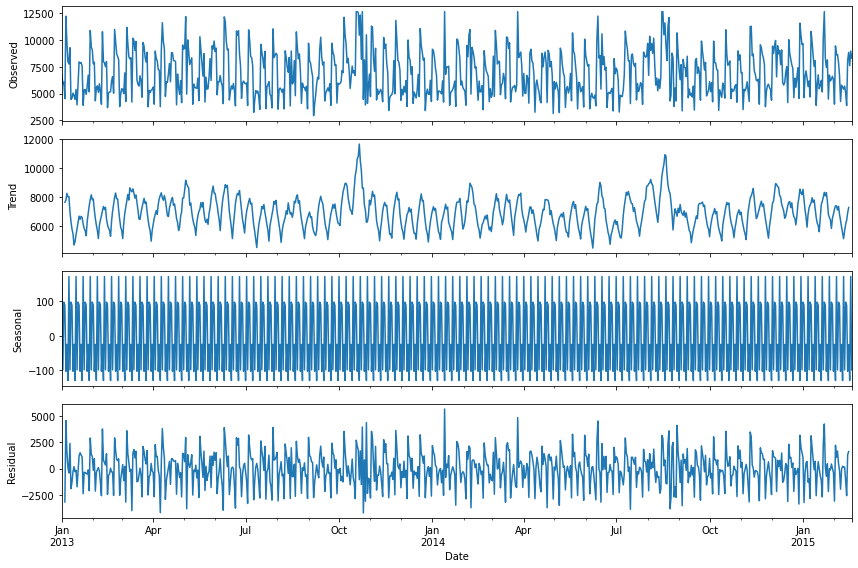

In [854]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize']  =12,8
decomposition = sm.tsa.seasonal_decompose(store_tsdf[1]['Sales'],model = 'additive')
fig = decomposition.plot()
plt.show()

### Data preparation

#### Split the time series data into test and train

In [855]:
# first two and half years as training set
# last six weeks as test set (means 42 days)
len(store_tsdf[1])

779

In [856]:

train = store_tsdf[1][['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][:-42]
test = store_tsdf[1][['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][-42:]

In [857]:
# inspect test and train 
len(train), len(test)

(737, 42)

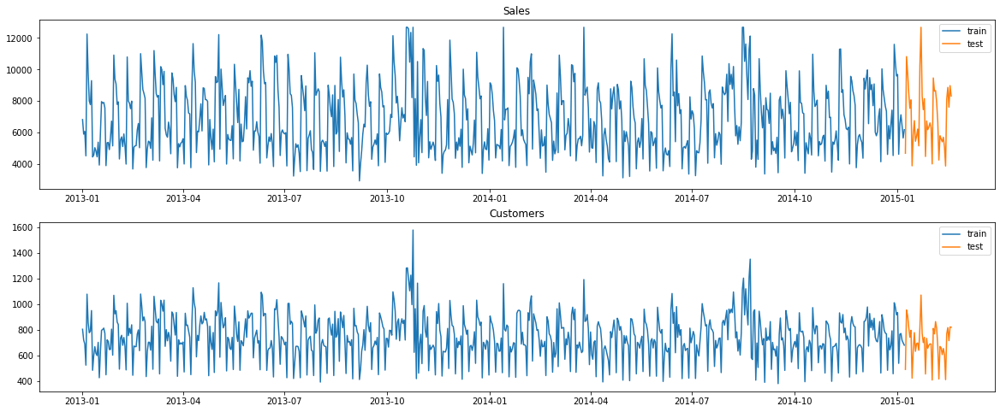

In [858]:
plt.figure(figsize = (20,8))
plt.subplot(211)
plt.plot(train['Sales'],label = 'train')
plt.plot(test['Sales'], label = 'test')
plt.title('Sales')
plt.legend(loc = 'best')

plt.subplot(212)
plt.plot(train['Customers'],label = 'train')
plt.plot(test['Customers'],label = 'test')
plt.title('Customers')
plt.legend(loc = 'best')
plt.show()

#### Standardize the train data

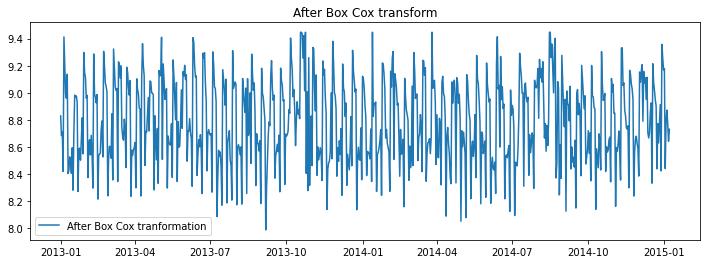

In [859]:
from scipy.stats import boxcox
train_boxcox = pd.DataFrame(boxcox(train['Sales'], lmbda=0), index = train.index, columns=['Sales'])
train_boxcox['Customers'] =  pd.Series(boxcox(train['Customers'], lmbda=0), index = train.index)

# plotting Sales after boxcox transformation
plt.figure(figsize=(12,4))
plt.plot(train_boxcox['Sales'], label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

#### Check for Stationarity

In [860]:
# Augmented Dickey Fuller test(ADF)
from statsmodels.tsa.stattools import adfuller

# Sales
adf_test = adfuller(train_boxcox['Sales'])

print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train_boxcox['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])


ADF Test for SALES
ADF Statistics: -6.488
Critical value @ 0.05: -2.87
p-value: 0.000000


ADF Test for CUSTOMERS
ADF Statistics: -5.585
Critical value @ 0.05: -2.87
p-value: 0.000001


In [861]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test
from statsmodels.tsa.stattools import kpss
kpss_test = kpss(train['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

kpss_test = kpss(train['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 0.049617
Critical Values @ 0.05: 0.46
p-value: 0.100000


KPSS test for Customers
KPSS Statistic: 0.148557
Critical Values @ 0.05: 0.46
p-value: 0.100000


Observation:
- Training dataset is stationary

### Model Building

#### AutoCorrelation function

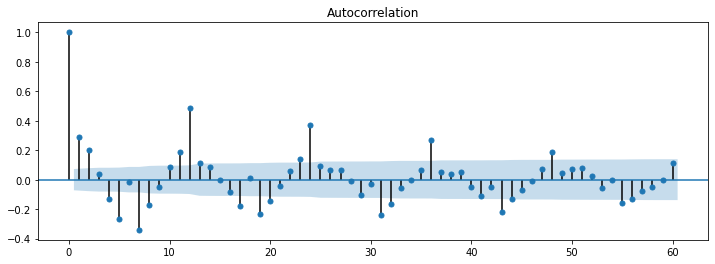

In [862]:
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12,4))
plot_acf(train_boxcox['Sales'], ax=plt.gca(), lags = 60)
plt.show()

#### Partial AutoCorrelation function.

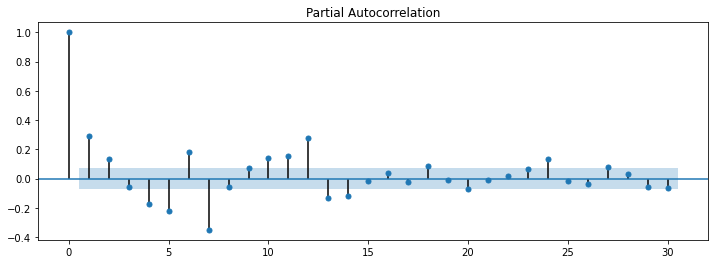

In [863]:
from statsmodels.graphics.tsaplots import plot_pacf
plt.figure(figsize=(12,4))
plot_pacf(train_boxcox['Sales'], ax=plt.gca(), lags = 30)
plt.show()

#### ARIMA MODEL

In [864]:
model = ARIMA(train_boxcox['Sales'], order=(4, 0, 2))
model_fit = model.fit()
print(model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  737
Model:                     ARMA(4, 2)   Log Likelihood                -117.774
Method:                       css-mle   S.D. of innovations              0.284
Date:                Mon, 12 Apr 2021   AIC                            251.547
Time:                        17:02:45   BIC                            288.368
Sample:                    01-01-2013   HQIC                           265.747
                         - 01-07-2015                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           8.7935      0.019    466.144      0.000       8.757       8.830
ar.L1.Sales    -0.6042      0.058    -10.465      0.000      -0.717      -0.491
ar.L2.Sales    -0.5043      0.042    -12.047    

##### Recover the orginal time series

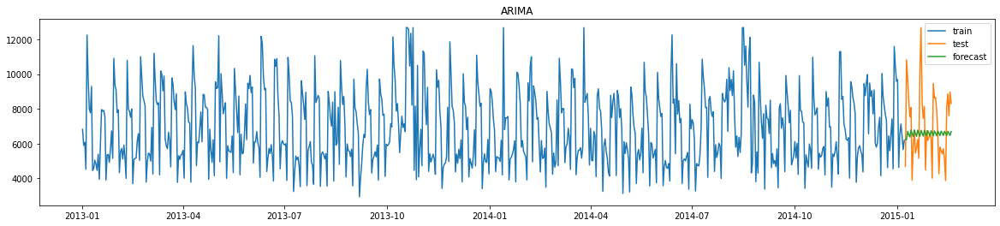

In [865]:
y_hat_ar = store_tsdf[1]['Sales'].copy()
y_hat_ar['ar_forecast_boxcox'] = model_fit.predict(start = test.index.min(), end = test.index.max())
y_hat_ar['ar_forecast'] = np.exp(y_hat_ar['ar_forecast_boxcox'])

graph(y_hat_ar['ar_forecast'],"ARIMA")

##### Calculate RMSE and MAPE

In [866]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_ar['ar_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_ar['ar_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_3_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64


#### Check for granger Causality Test

In [867]:
grangers_causality_matrix(train,variables = train.columns)

,Sales_x,Customers_x,DayOfWeek_x,Promo_x,SchoolHoliday_x,StateHoliday_x
Sales_y,1.0,0.0,0.0,0.0,0.0,1.0
Customers_y,0.0,1.0,0.0,0.0,0.0,1.0
DayOfWeek_y,0.0,0.0,1.0,0.0,0.0,1.0
Promo_y,0.0,0.0,0.0,1.0,0.0,1.0
SchoolHoliday_y,0.0,0.0,0.0,0.0,1.0,1.0
StateHoliday_y,NaN,NaN,NaN,NaN,NaN,NaN


#### VAR model

In [868]:

mod = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']], order=(3,0), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())
#Note the AIC value - lower AIC => better model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  737
Model:                             VAR(3)   Log Likelihood                 791.789
Date:                    Mon, 12 Apr 2021   AIC                          -1553.579
Time:                            17:02:53   BIC                          -1484.540
Sample:                        01-01-2013   HQIC                         -1526.955
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              647.09, 153.07   Jarque-Bera (JB):          32.43, 1.86
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.39
Heteroskedasticity (H):         0.86, 1.14   Skew:                     -0.46, -0.09
Prob(H) (two-sided):            0.25, 0.30   Kurtosis:                   3.47, 3.16


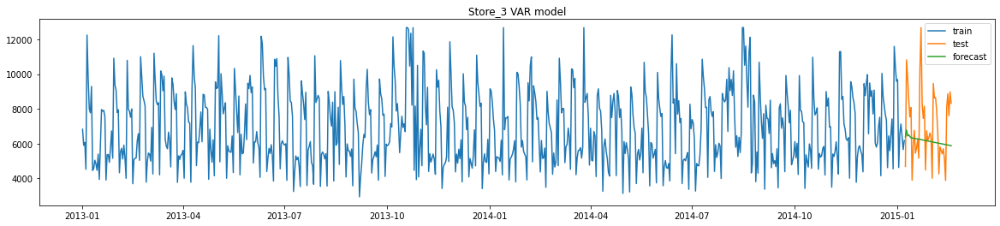

In [869]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_var = mod.fit().predict(start=start_index, end=end_index)
y_hat_var = np.exp(y_hat_var)
graph(y_hat_var['Sales'],"Store_3 VAR model")


In [870]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'])).round(2)
#print('Income: RMSE:',  rmse)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_var['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_3_VAR'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results



,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31


#### Johansen cointegration Test

In [871]:
coint=coint_johansen(np.asarray(train_boxcox[['Sales','Customers']]),0,1)
# coint.trace_stat
# coint.max_eig_stat
traces = coint.lr1
maxeig=coint.lr2
cvts = coint.cvt  ## 0: 90%  1:95% 2: 99%
cvms = coint.cvm   ## 0: 90%  1:95% 2: 99%

N, l = np.asarray(train[['Sales','Customers']]).shape

for i in range(l):
    if traces[i] > cvts[i, 1]:
        r = i + 1
print(r)

2


Observation:
- No cointgeration
- Both series are stationary

#### VARMAX

In [872]:
exog = train['SchoolHoliday']
mod_varmax = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']],exog= exog, order=(5,3), trend='c')
resmax = mod_varmax.fit(maxiter=1000, disp=False)
print(resmax.summary())

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  737
Model:                        VARMAX(5,3)   Log Likelihood                1019.162
                              + intercept   AIC                          -1960.324
Date:                    Mon, 12 Apr 2021   BIC                          -1780.823
Time:                            17:04:47   HQIC                         -1891.102
Sample:                        01-01-2013                                         
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              365.20, 100.83   Jarque-Bera (JB):         10.83, 21.62
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.91, 1.24   Skew:                     -0.29, -0.24
P

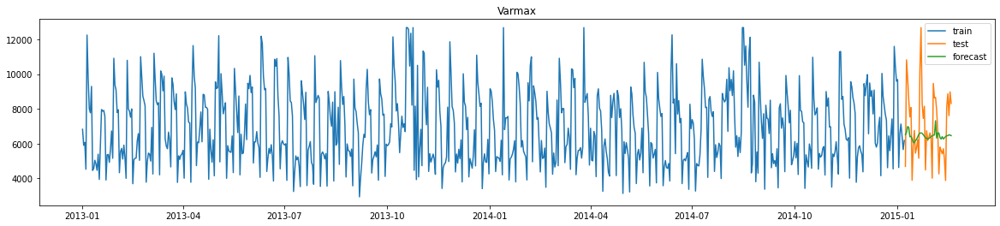

In [873]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
#y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = exog[-42:])
y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)
graph(y_hat_varmax['Sales'],"Varmax")


In [874]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'])).round(2)
#print('Income: RMSE:',  rmse)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_varmax['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_3_VARMAX_SchoolHoliday'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16


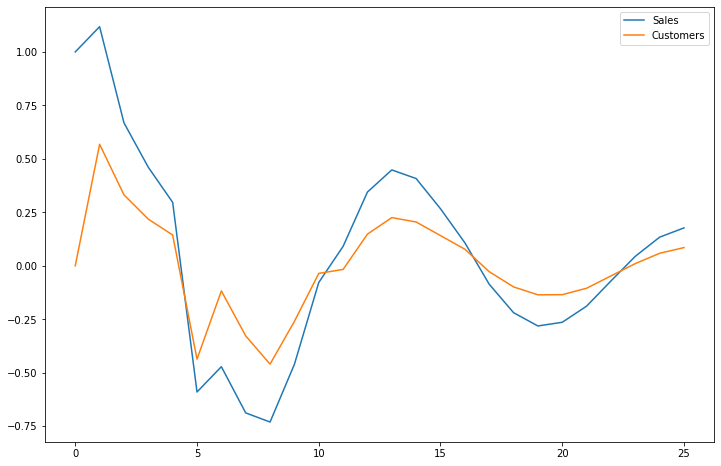

In [875]:
irf = resmax.impulse_responses(steps = 25, orthogonalized= False)
irf.plot()

## EDA, Model Building and Forecasting for Store 8

### EDA:Store wise analysis

<Figure size 1440x288 with 0 Axes>

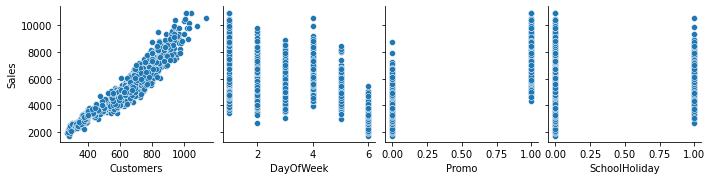

In [876]:
# Analysis relation between sales and other variables
plt.figure(figsize= [20,4])

sns.pairplot(store_df[2], x_vars= ['Customers','DayOfWeek', 'Promo', 'SchoolHoliday'],y_vars = ["Sales"],)

plt.show()
  

Observation:
- A strong relation can be seen between Sales and Customers.
- Minimum value of sale is higher when promotion is done.

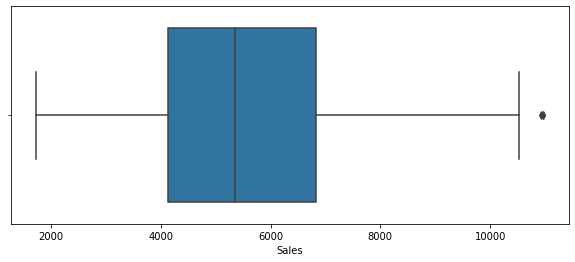

In [877]:
 # Analyse spread of Sales

plt.figure(figsize= [10,4])
sns.boxplot(store_df[2]['Sales'])
 
plt.show()

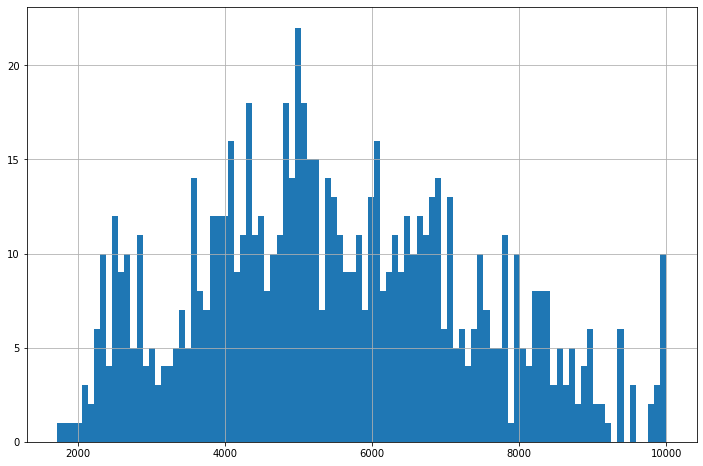

In [878]:
# distribution of Sales density 
store_tsdf[2]['Sales'].hist(bins= 100)
plt.show()

Observation:
- Most of the sales value lies between 3000 to 9000.
- Sales peak is at 5000  around. 

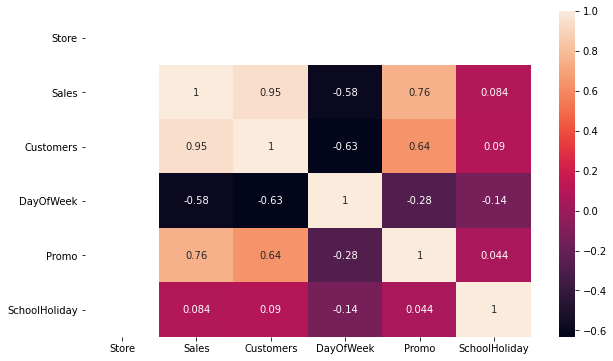

In [879]:
# analyse correlation

plt.figure(figsize=[10,6])
sns.heatmap(store_tsdf[2].corr(),annot=True)
plt.show()

Obsevation:
- Very high correlation between Sales and Customers
- Good correlation between Promo and Sales.

#### Decompostion of time series Data 

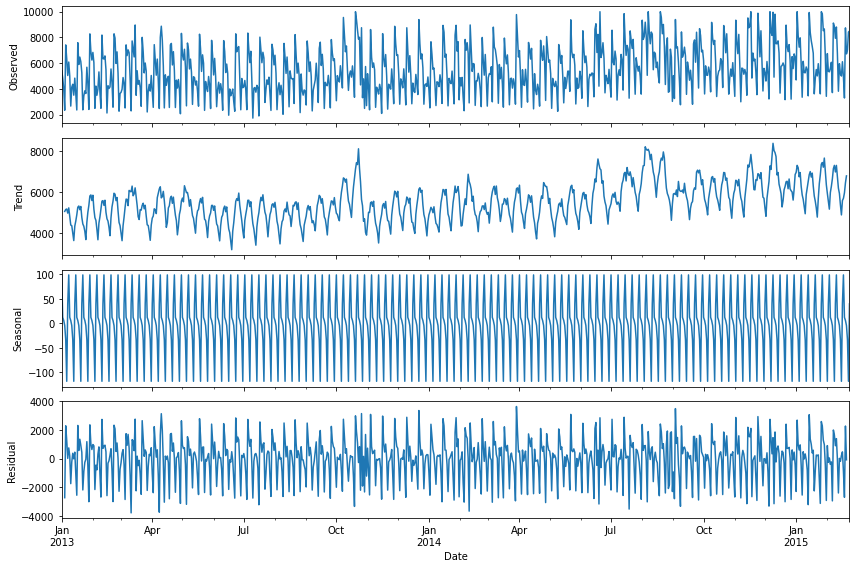

In [880]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize']  =12,8
decomposition = sm.tsa.seasonal_decompose(store_tsdf[2]['Sales'],model = 'additive')
fig = decomposition.plot()
plt.show()

### Data preparation

#### Split the time series data into test and train

In [881]:
# first two and half years as training set
# last six weeks as test set (means 42 days)
len(store_tsdf[2])

784

In [882]:

train = store_tsdf[2][['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][:-42]
test = store_tsdf[2][['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][-42:]

In [883]:
# inspect test and train 
len(train), len(test)

(742, 42)

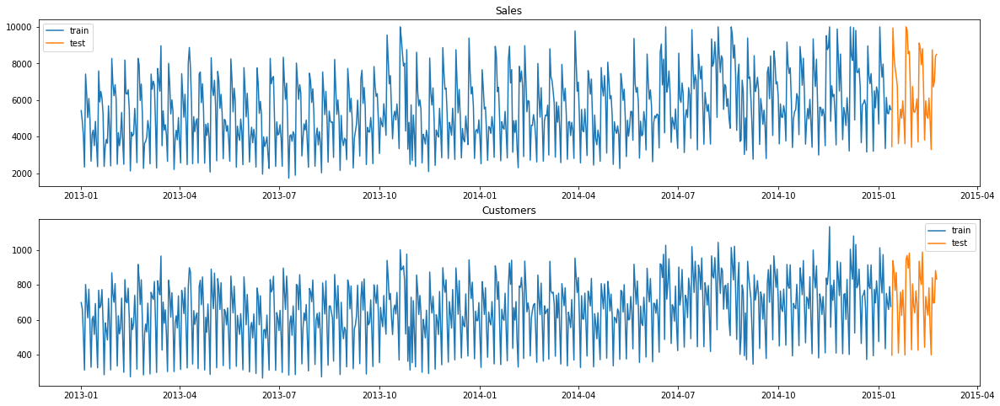

In [884]:
plt.figure(figsize = (20,8))
plt.subplot(211)
plt.plot(train['Sales'],label = 'train')
plt.plot(test['Sales'], label = 'test')
plt.title('Sales')
plt.legend(loc = 'best')

plt.subplot(212)
plt.plot(train['Customers'],label = 'train')
plt.plot(test['Customers'],label = 'test')
plt.title('Customers')
plt.legend(loc = 'best')
plt.show()

#### Standardize the train data

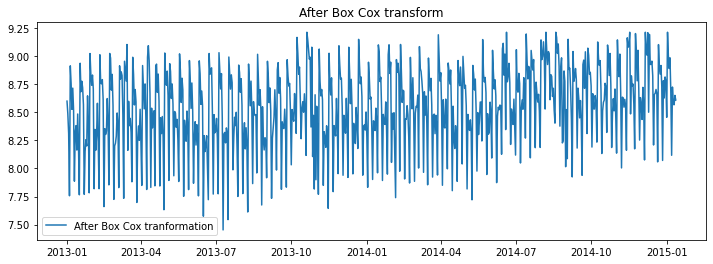

In [885]:
from scipy.stats import boxcox
train_boxcox = pd.DataFrame(boxcox(train['Sales'], lmbda=0), index = train.index, columns=['Sales'])
train_boxcox['Customers'] =  pd.Series(boxcox(train['Customers'], lmbda=0), index = train.index)

# plotting Sales after boxcox transformation
plt.figure(figsize=(12,4))
plt.plot(train_boxcox['Sales'], label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

#### Check for Stationarity

In [886]:
# Augmented Dickey Fuller test(ADF)
from statsmodels.tsa.stattools import adfuller

# Sales
adf_test = adfuller(train_boxcox['Sales'])

print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train_boxcox['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])


ADF Test for SALES
ADF Statistics: -3.027
Critical value @ 0.05: -2.87
p-value: 0.032450


ADF Test for CUSTOMERS
ADF Statistics: -3.167
Critical value @ 0.05: -2.87
p-value: 0.022000


Observation:
- Training dataset is stationary

### Model Building

#### AutoCorrelation function

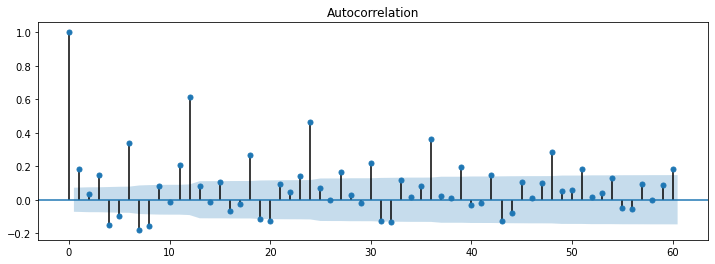

In [887]:
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12,4))
plot_acf(train_boxcox['Sales'], ax=plt.gca(), lags = 60)
plt.show()

#### Partial AutoCorrelation function.

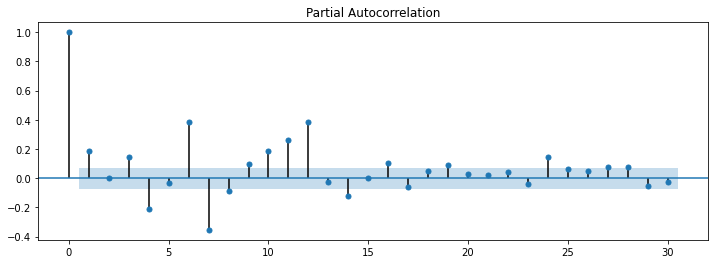

In [888]:
from statsmodels.graphics.tsaplots import plot_pacf
plt.figure(figsize=(12,4))
plot_pacf(train_boxcox['Sales'], ax=plt.gca(), lags = 30)
plt.show()

#### ARIMA MODEL

In [889]:
model = ARIMA(train_boxcox['Sales'], order=(12, 1, 4))
model_fit = model.fit()
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Sales   No. Observations:                  741
Model:                ARIMA(12, 1, 4)   Log Likelihood                 -44.039
Method:                       css-mle   S.D. of innovations              0.255
Date:                Mon, 12 Apr 2021   AIC                            124.078
Time:                        17:07:32   BIC                            207.022
Sample:                    01-02-2013   HQIC                           156.056
                         - 01-12-2015                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.0004      0.000      2.350      0.019    6.96e-05       0.001
ar.L1.D.Sales      0.2154      0.103      2.090      0.037       0.013       0.417
ar.L2.D.Sales     -0.3656      0.088

##### Recover the orginal time series

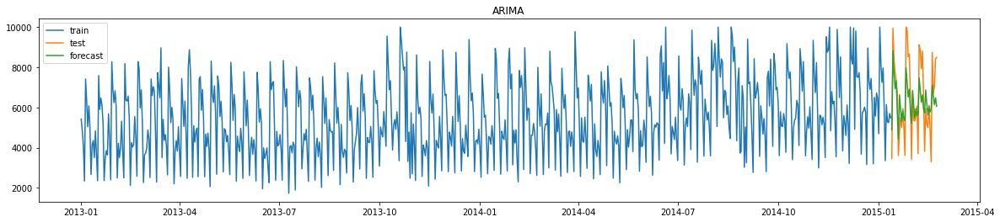

In [890]:
y_hat_ar = store_tsdf[2]['Sales'].copy()
y_hat_ar['ar_forecast_boxcox_diff'] = model_fit.predict(start = test.index.min(), end = test.index.max())
y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox_diff'].cumsum()
y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox'].add(train_boxcox['Sales'][0])
y_hat_ar['ar_forecast'] = np.exp(y_hat_ar['ar_forecast_boxcox'])

graph(y_hat_ar['ar_forecast'],"ARIMA")

##### Calculate RMSE and MAPE

In [891]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_ar['ar_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_ar['ar_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_8_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43


#### Check for granger Causality Test

In [892]:
grangers_causality_matrix(train,variables = train.columns)

,Sales_x,Customers_x,DayOfWeek_x,Promo_x,SchoolHoliday_x,StateHoliday_x
Sales_y,1.0000,0.0,0.0,0.000,0.0,1.0
Customers_y,0.0000,1.0,0.0,0.000,0.0,1.0
DayOfWeek_y,0.0000,0.0,1.0,0.000,0.0,1.0
Promo_y,0.0000,0.0,0.0,1.000,0.0,1.0
SchoolHoliday_y,0.0004,0.0,0.0,0.001,1.0,1.0
StateHoliday_y,NaN,NaN,NaN,NaN,NaN,NaN


#### VAR model

In [893]:

mod = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']], order=(3,0), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())
#Note the AIC value - lower AIC => better model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  742
Model:                             VAR(3)   Log Likelihood                 616.133
Date:                    Mon, 12 Apr 2021   AIC                          -1202.265
Time:                            17:07:51   BIC                          -1133.125
Sample:                        01-01-2013   HQIC                         -1175.611
                             - 01-12-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              777.43, 253.98   Jarque-Bera (JB):           7.11, 1.18
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.03, 0.55
Heteroskedasticity (H):         0.64, 0.81   Skew:                      -0.22, 0.09
Prob(H) (two-sided):            0.00, 0.09   Kurtosis:                   3.18, 2.93


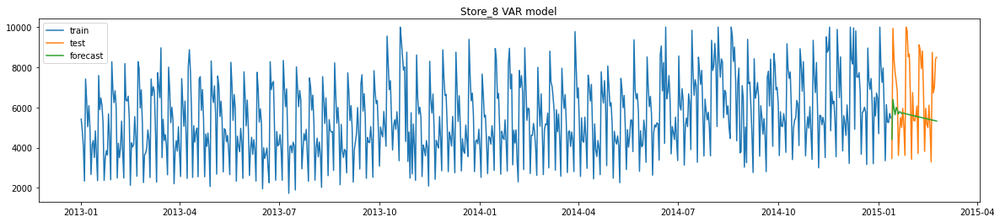

In [894]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_var = mod.fit().predict(start=start_index, end=end_index)
y_hat_var = np.exp(y_hat_var)
graph(y_hat_var['Sales'],"Store_8 VAR model")


In [895]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'])).round(2)
#print('Income: RMSE:',  rmse)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_var['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_8_VAR'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results



,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57


#### Johansen cointegration Test

In [896]:
coint=coint_johansen(np.asarray(train_boxcox[['Sales','Customers']]),0,1)
# coint.trace_stat
# coint.max_eig_stat
traces = coint.lr1
maxeig=coint.lr2
cvts = coint.cvt  ## 0: 90%  1:95% 2: 99%
cvms = coint.cvm   ## 0: 90%  1:95% 2: 99%

N, l = np.asarray(train[['Sales','Customers']]).shape

for i in range(l):
    if traces[i] > cvts[i, 1]:
        r = i + 1
print(r)

2


Observation:
- No cointgeration
- Both series are stationary

#### VARMAX

In [897]:
exog = train['SchoolHoliday']
mod_varmax = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']],exog= exog, order=(5,4), trend='c')
resmax = mod_varmax.fit(maxiter=1000, disp=False)
print(resmax.summary())

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  742
Model:                        VARMAX(5,4)   Log Likelihood                 910.874
                              + intercept   AIC                          -1735.747
Date:                    Mon, 12 Apr 2021   BIC                          -1537.545
Time:                            17:09:17   HQIC                         -1659.338
Sample:                        01-01-2013                                         
                             - 01-12-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              408.01, 124.54   Jarque-Bera (JB):         14.43, 12.04
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.86, 0.83   Skew:                     -0.31, -0.02
P

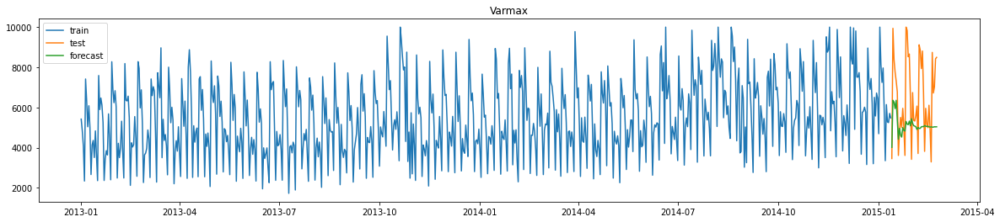

In [898]:
# forecast
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
#y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = exog[-42:])
y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)
graph(y_hat_varmax['Sales'],"Varmax")


#### Evaluate using MAPE and RMSE

In [899]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'])).round(2)
#print('Income: RMSE:',  rmse)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_varmax['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_8_VARMAX_SchoolHoliday'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98


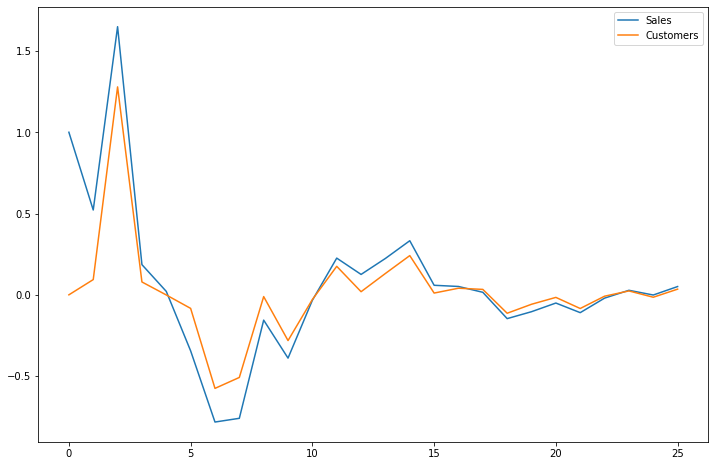

In [900]:
irf = resmax.impulse_responses(steps = 25, orthogonalized= False)
irf.plot()

## EDA, Model Building and Forecasting for Store 9

### EDA:Store wise analysis

<Figure size 1440x288 with 0 Axes>

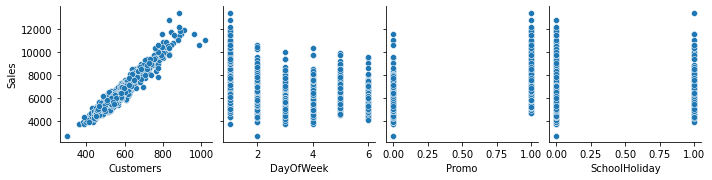

In [901]:
# Analysis relation between sales and variables
plt.figure(figsize= [20,4])

sns.pairplot(store_df[3], x_vars= ['Customers','DayOfWeek', 'Promo', 'SchoolHoliday'],y_vars = ["Sales"],)

plt.show()
  

Observation:
- A strong relation can be seen between Sales and Customers
- Tower of Sales are  higher on weekend compare to weekdays.
- Minimum value of sale is higher when promotion is done.

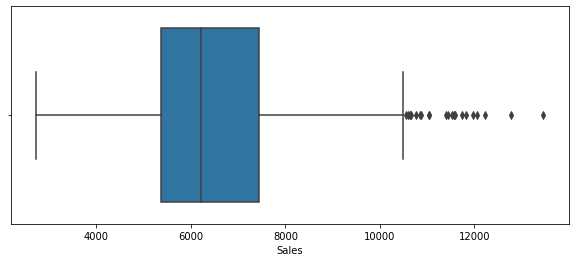

In [902]:
 # Analyse spread of Sales

plt.figure(figsize= [10,4])
sns.boxplot(store_df[3]['Sales'])
 
plt.show()

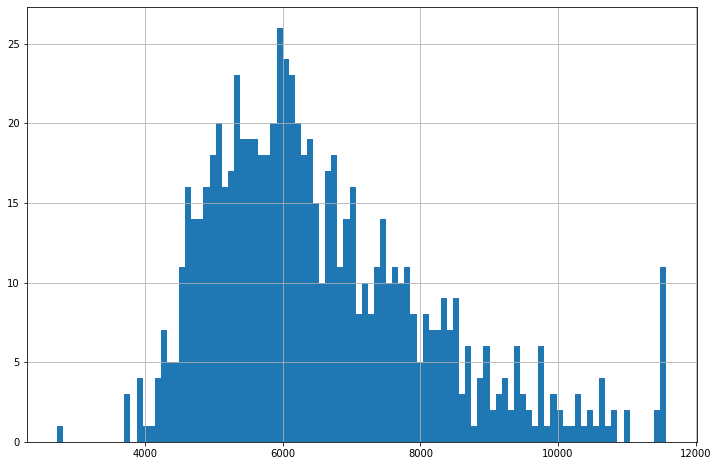

In [903]:
# distribution of Sales density 
store_tsdf[3]['Sales'].hist(bins= 100)
plt.show()

Observation:
- Most of the sales value lies between 4000 to 10000.
- Sales peak is at 6000 around. 

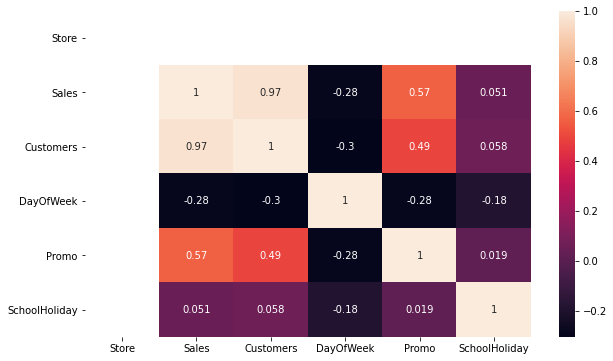

In [904]:
# analyse correlation

plt.figure(figsize=[10,6])
sns.heatmap(store_tsdf[3].corr(),annot=True)
plt.show()

Obsevation:
- Very high correlation between Sales and Customers
- Good correlation between Promo and Sales.

#### Decompostion of time series Data 

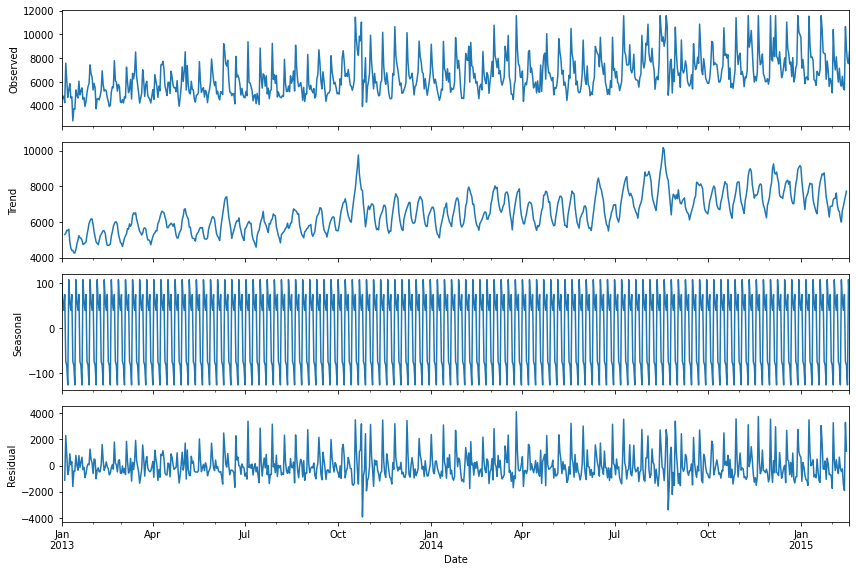

In [905]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize']  =12,8
decomposition = sm.tsa.seasonal_decompose(store_tsdf[3]['Sales'],model = 'additive')
fig = decomposition.plot()
plt.show()

### Data preparation

#### Split the time series data into test and train

In [906]:
# first two and half years as training set
# last six weeks as test set (means 42 days)
len(store_tsdf[3])


779

In [907]:

train = store_tsdf[3][['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][:-42]
test = store_tsdf[3][['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][-42:]

In [908]:
# inspect test and train 
len(train), len(test)

(737, 42)

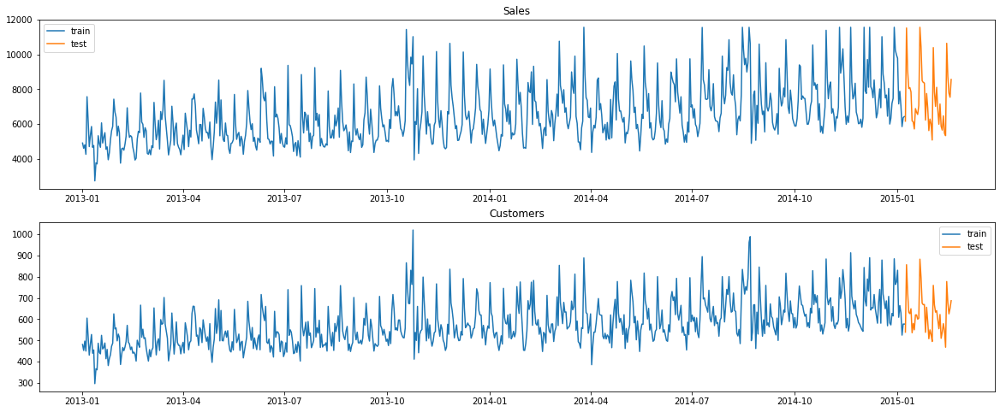

In [909]:
plt.figure(figsize = (20,8))
plt.subplot(211)
plt.plot(train['Sales'],label = 'train')
plt.plot(test['Sales'], label = 'test')
plt.title('Sales')
plt.legend(loc = 'best')

plt.subplot(212)
plt.plot(train['Customers'],label = 'train')
plt.plot(test['Customers'],label = 'test')
plt.title('Customers')
plt.legend(loc = 'best')
plt.show()

#### Standardize the train data

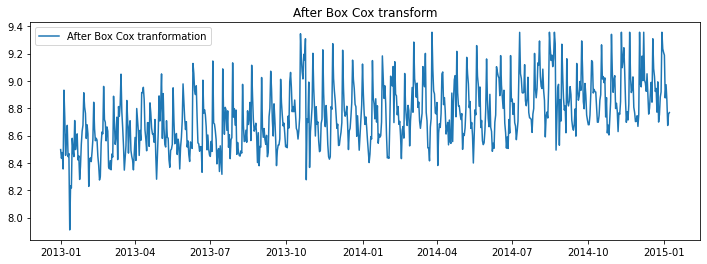

In [910]:
from scipy.stats import boxcox
train_boxcox = pd.DataFrame(boxcox(train['Sales'], lmbda=0), index = train.index, columns=['Sales'])
train_boxcox['Customers'] =  pd.Series(boxcox(train['Customers'], lmbda=0), index = train.index)

# plotting Sales after boxcox transformation
plt.figure(figsize=(12,4))
plt.plot(train_boxcox['Sales'], label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

#### Check for Stationarity

In [911]:
# Augmented Dickey Fuller test(ADF)
from statsmodels.tsa.stattools import adfuller

# Sales
adf_test = adfuller(train_boxcox['Sales'])

print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])


ADF Test for SALES
ADF Statistics: -2.655
Critical value @ 0.05: -2.87
p-value: 0.082211


ADF Test for CUSTOMERS
ADF Statistics: -3.159
Critical value @ 0.05: -2.87
p-value: 0.022482


Observation:
- Sales dataset is not stationary
- Customer dataset is stationary

#### Differenceing to remove trend 

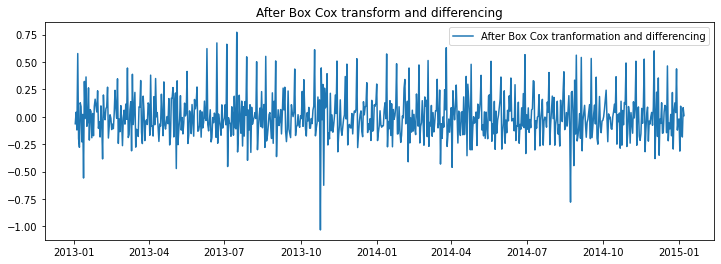

In [912]:
train_boxcox_diff = pd.DataFrame(pd.Series(train_boxcox['Sales'] - train_boxcox['Sales'].shift(), train.index))
train_boxcox_diff['Sales'] = train_boxcox_diff
train_boxcox_diff['Customers'] = train_boxcox['Customers'] - train_boxcox['Customers'].shift()
train_boxcox_diff.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(train_boxcox_diff['Sales'], label='After Box Cox tranformation and differencing')
plt.legend(loc='best')
plt.title('After Box Cox transform and differencing')
plt.show()

#### Check for stationarity after differencing

In [913]:
# Augmented Dickey Fuller test(ADF)
from statsmodels.tsa.stattools import adfuller

# Sales
adf_test = adfuller(train_boxcox_diff['Sales'])

print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train_boxcox_diff['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Test for SALES
ADF Statistics: -10.308
Critical value @ 0.05: -2.87
p-value: 0.000000


ADF Test for CUSTOMERS
ADF Statistics: -10.074
Critical value @ 0.05: -2.87
p-value: 0.000000


Observation:
- Now the training dataset is  stationary.

### Model Building

#### AutoCorrelation function

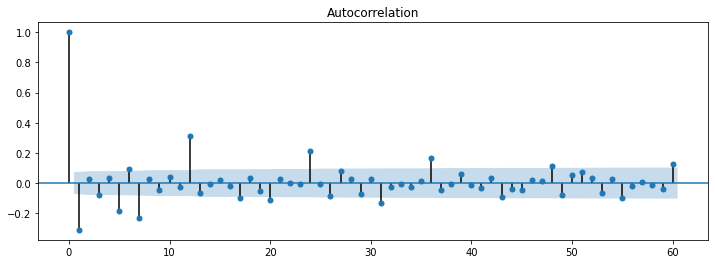

In [914]:
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12,4))
plot_acf(train_boxcox_diff['Sales'], ax=plt.gca(), lags = 60)
plt.show()

#### Partial AutoCorrelation function.

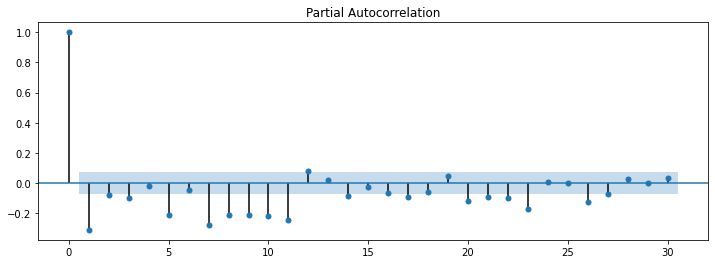

In [915]:
from statsmodels.graphics.tsaplots import plot_pacf
plt.figure(figsize=(12,4))
plot_pacf(train_boxcox_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

#### ARIMA MODEL

In [916]:
model = ARIMA(train_boxcox_diff['Sales'], order=(2,0,2))
model_fit = model.fit()
print(model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  736
Model:                     ARMA(2, 2)   Log Likelihood                 243.300
Method:                       css-mle   S.D. of innovations              0.173
Date:                Mon, 12 Apr 2021   AIC                           -474.600
Time:                        17:09:24   BIC                           -446.992
Sample:                    01-02-2013   HQIC                          -463.953
                         - 01-07-2015                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.0006   6.09e-05      9.090      0.000       0.000       0.001
ar.L1.Sales    -0.4205      0.048     -8.705      0.000      -0.515      -0.326
ar.L2.Sales     0.4968      0.033     15.152    

##### Recover the orginal time series

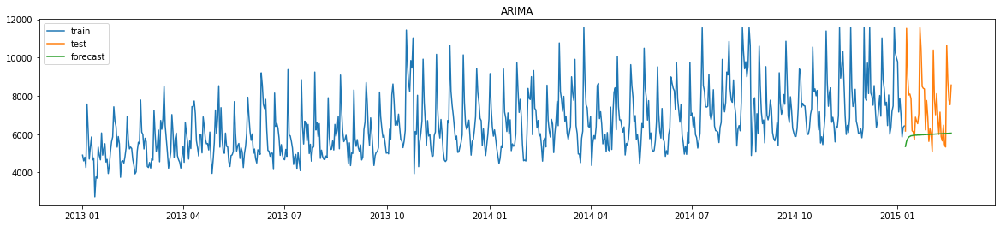

In [917]:
y_hat_ar = store_tsdf[3]['Sales'].copy()
y_hat_ar['ar_forecast_boxcox_diff'] = model_fit.predict(start = test.index.min(), end = test.index.max())
y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox_diff'].cumsum()
y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox'].add(train_boxcox['Sales'][0])
y_hat_ar['ar_forecast'] = np.exp(y_hat_ar['ar_forecast_boxcox'])

graph(y_hat_ar['ar_forecast'],"ARIMA")

##### Calculate RMSE and MAPE

In [918]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_ar['ar_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_ar['ar_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_9_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Check for granger Causality Test

In [919]:
grangers_causality_matrix(train,variables = train.columns)

,Sales_x,Customers_x,DayOfWeek_x,Promo_x,SchoolHoliday_x,StateHoliday_x
Sales_y,1.0,0.0000,0.0,0.0,0.0,1.0
Customers_y,0.0,1.0000,0.0,0.0,0.0,1.0
DayOfWeek_y,0.0,0.0000,1.0,0.0,0.0,1.0
Promo_y,0.0,0.0000,0.0,1.0,0.0,1.0
SchoolHoliday_y,0.0,0.0003,0.0,0.0,1.0,1.0
StateHoliday_y,NaN,NaN,NaN,NaN,NaN,NaN


#### VAR model

In [920]:
 
mod = sm.tsa.VARMAX(train_boxcox_diff[['Sales','Customers']], order=(12,0), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())
#Note the AIC value - lower AIC => better model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  736
Model:                            VAR(12)   Log Likelihood                1603.084
Date:                    Mon, 12 Apr 2021   AIC                          -3104.169
Time:                            17:09:57   BIC                          -2869.506
Sample:                        01-02-2013   HQIC                         -3013.669
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                73.58, 34.15   Jarque-Bera (JB):         80.85, 12.35
Prob(Q):                        0.00, 0.73   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.03, 1.17   Skew:                       0.45, 0.06
Prob(H) (two-sided):            0.82, 0.22   Kurtosis:                   4.36, 3.62


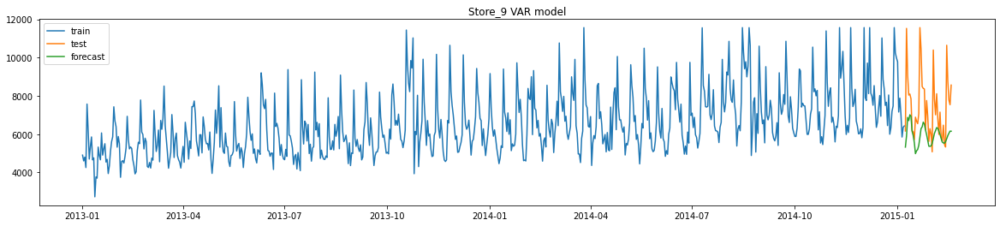

In [921]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_var = mod.fit().predict(start=start_index, end=end_index)
y_hat_var['Sales'] = y_hat_var['Sales'].cumsum()
y_hat_var['Sales'] = y_hat_var['Sales'].add(train_boxcox['Sales'][0])
y_hat_var = np.exp(y_hat_var)

graph(y_hat_var['Sales'],"Store_9 VAR model")


In [922]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'])).round(2)
#print('Income: RMSE:',  rmse)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_var['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_9_VAR'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results



,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Johansen cointegration Test

In [923]:
coint=coint_johansen(np.asarray(train_boxcox_diff[['Sales','Customers']]),0,1)
# coint.trace_stat
# coint.max_eig_stat
traces = coint.lr1
maxeig=coint.lr2
cvts = coint.cvt  ## 0: 90%  1:95% 2: 99%
cvms = coint.cvm   ## 0: 90%  1:95% 2: 99%

N, l = np.asarray(train[['Sales','Customers']]).shape

for i in range(l):
    if traces[i] > cvts[i, 1]:
        r = i + 1
print(r)

2


Observation:
- No cointgeration
- Both series are stationary

#### VARMAX

In [924]:
exog = train['SchoolHoliday']
mod_varmax = sm.tsa.VARMAX(train_boxcox_diff[['Sales', 'Customers']],exog= exog[1:], order=(1,1), trend='c')
resmax = mod_varmax.fit(maxiter=1000, disp=False)
print(resmax.summary())

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  736
Model:                        VARMAX(1,1)   Log Likelihood                1492.979
                              + intercept   AIC                          -2955.958
Date:                    Mon, 12 Apr 2021   BIC                          -2886.939
Time:                            17:10:48   HQIC                         -2929.340
Sample:                        01-02-2013                                         
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               283.86, 58.75   Jarque-Bera (JB):        159.07, 21.74
Prob(Q):                        0.00, 0.03   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.96, 1.12   Skew:                       0.80, 0.09
P

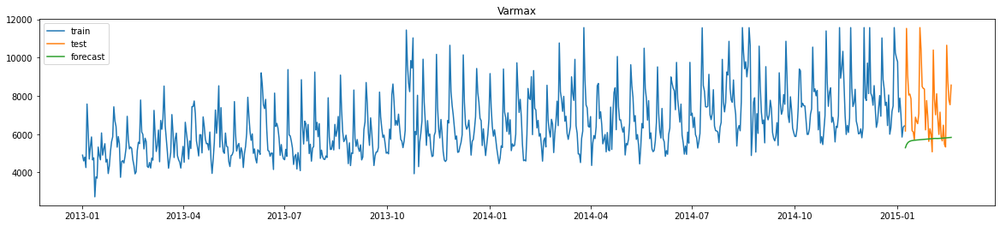

In [925]:
# forecast
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
#y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = exog[-42:])
y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = np.array(exog[-42:]).reshape(42,1))
y_hat_varmax['Sales'] = y_hat_varmax['Sales'].cumsum()
y_hat_varmax['Sales'] = y_hat_varmax['Sales'].add(train_boxcox['Sales'][0])
y_hat_varmax = np.exp(y_hat_varmax)
graph(y_hat_varmax['Sales'],"Varmax")


In [926]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'])).round(2)
#print('Income: RMSE:',  rmse)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_varmax['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_9_VARMAX_SchoolHoliday'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


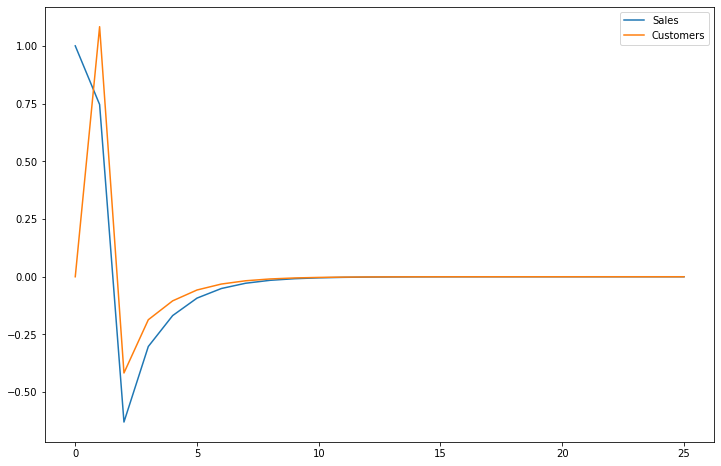

In [927]:
irf = resmax.impulse_responses(steps = 25, orthogonalized= False)
irf.plot()

## EDA, Model Building and Forecasting for Store 13

### EDA:Store wise analysis

<Figure size 1440x288 with 0 Axes>

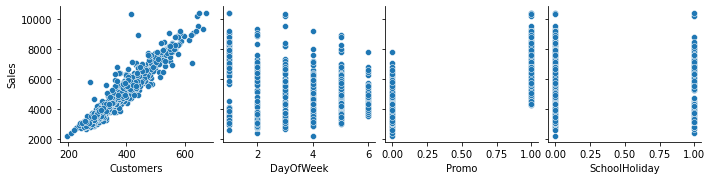

In [928]:
# Analysis relation between sales and variables
plt.figure(figsize= [20,4])

sns.pairplot(store_df[4], x_vars= ['Customers','DayOfWeek', 'Promo', 'SchoolHoliday'],y_vars = ["Sales"],)

plt.show()
  

Observation:
- A strong relation can be seen between Sales and Customers
- Tower of Sales are  higher on weekend compare to weekdays.
- Minimum value of sale is higher when promotion is done.

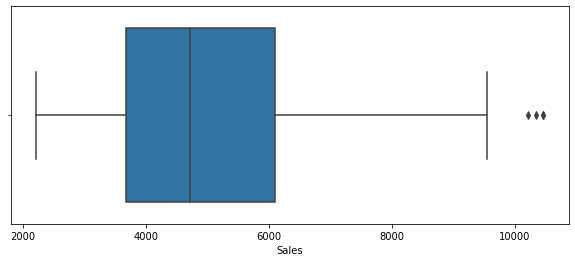

In [929]:
 # Analyse spread of Sales

plt.figure(figsize= [10,4])
sns.boxplot(store_df[4]['Sales'])
 
plt.show()

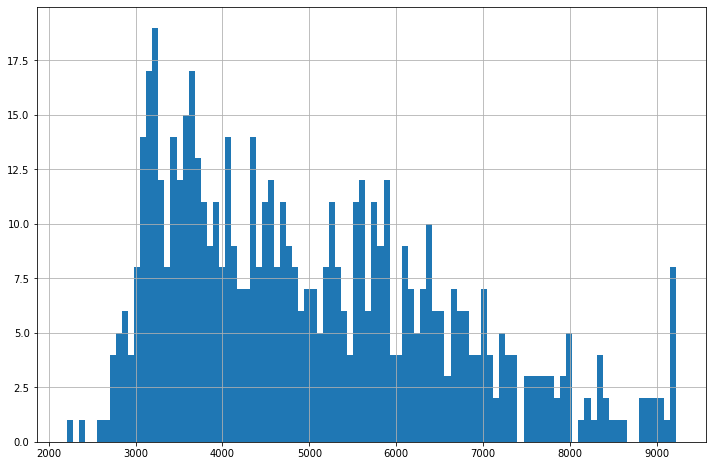

In [930]:
# distribution of Sales density 
store_tsdf[4]['Sales'].hist(bins= 100)
plt.show()

Observation:
- Most of the sales value lies between 3000 to 6000.
- Sales peak are at 4000 and 4600 around. 

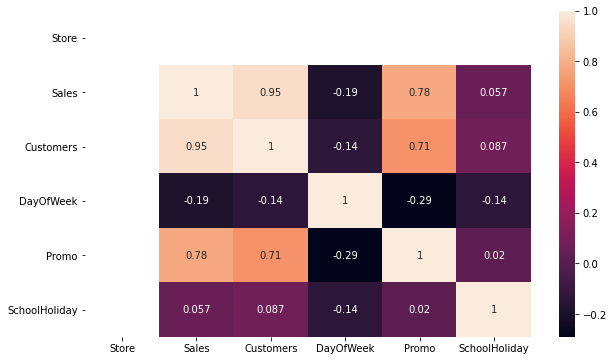

In [931]:
# analyse correlation

plt.figure(figsize=[10,6])
sns.heatmap(store_tsdf[4].corr(),annot=True)
plt.show()

Obsevation:
- Very high correlation between Sales and Customers
- Good correlation between Promo and Sales.

#### Decompostion of time series Data 

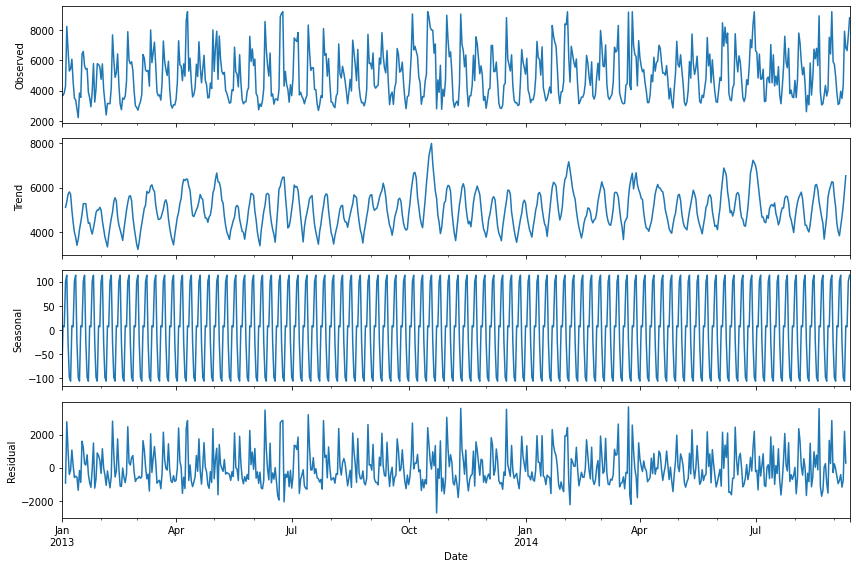

In [932]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize']  =12,8
decomposition = sm.tsa.seasonal_decompose(store_tsdf[4]['Sales'],model = 'additive')
fig = decomposition.plot()
plt.show()

### Data preparation

#### Split the time series data into test and train

In [933]:
# first two and half years as training set
# last six weeks as test set (means 42 days)
len(store_tsdf[2])

784

In [934]:

train = store_tsdf[2][['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][:-42]
test = store_tsdf[2][['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][-42:]

In [935]:
# inspect test and train 
len(train), len(test)

(742, 42)

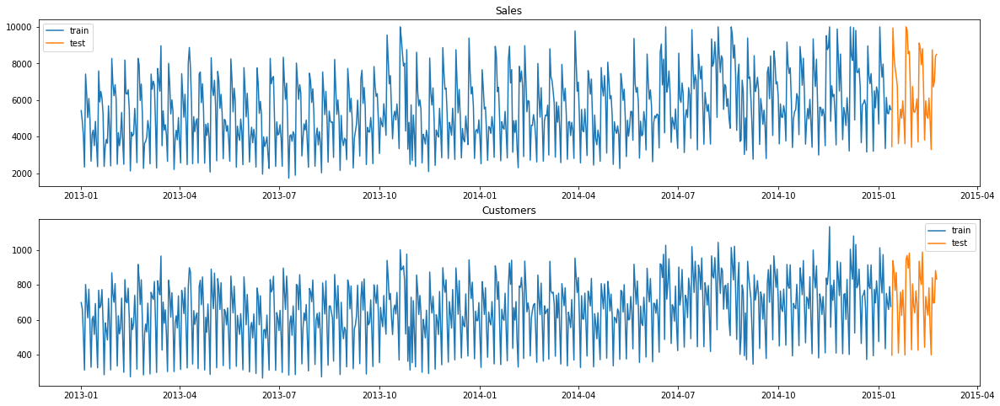

In [936]:
plt.figure(figsize = (20,8))
plt.subplot(211)
plt.plot(train['Sales'],label = 'train')
plt.plot(test['Sales'], label = 'test')
plt.title('Sales')
plt.legend(loc = 'best')

plt.subplot(212)
plt.plot(train['Customers'],label = 'train')
plt.plot(test['Customers'],label = 'test')
plt.title('Customers')
plt.legend(loc = 'best')
plt.show()

#### Standardize the train data

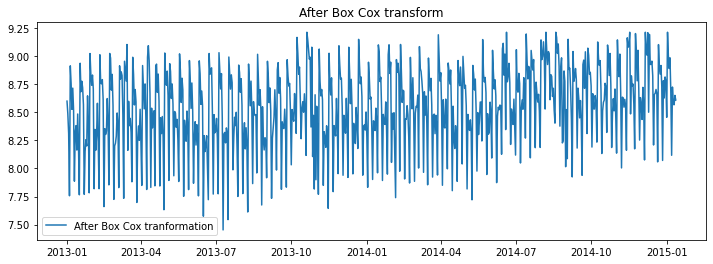

In [937]:
from scipy.stats import boxcox
train_boxcox = pd.DataFrame(boxcox(train['Sales'], lmbda=0), index = train.index, columns=['Sales'])
train_boxcox['Customers'] =  pd.Series(boxcox(train['Customers'], lmbda=0), index = train.index)

# plotting Sales after boxcox transformation
plt.figure(figsize=(12,4))
plt.plot(train_boxcox['Sales'], label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

#### Check for Stationarity

In [938]:
# Augmented Dickey Fuller test(ADF)
from statsmodels.tsa.stattools import adfuller

# Sales
adf_test = adfuller(train['Sales'])

print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])


ADF Test for SALES
ADF Statistics: -3.178
Critical value @ 0.05: -2.87
p-value: 0.021270


ADF Test for CUSTOMERS
ADF Statistics: -2.915
Critical value @ 0.05: -2.87
p-value: 0.043600


In [939]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test
from statsmodels.tsa.stattools import kpss
kpss_test = kpss(train['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

kpss_test = kpss(train['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 2.143698
Critical Values @ 0.05: 0.46
p-value: 0.010000


KPSS test for Customers
KPSS Statistic: 2.369524
Critical Values @ 0.05: 0.46
p-value: 0.010000


Observation:
- Training dataset is stationary

### Model Building

#### AutoCorrelation function

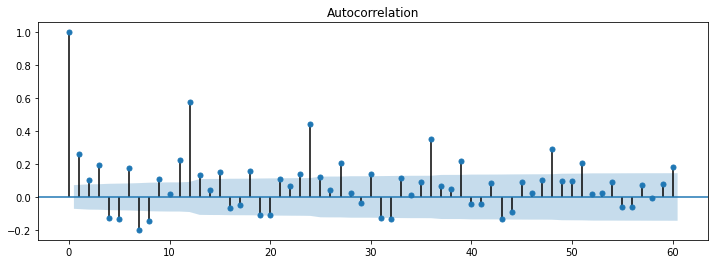

In [940]:
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12,4))
plot_acf(train['Sales'], ax=plt.gca(), lags = 60)
plt.show()

#### Partial AutoCorrelation function.

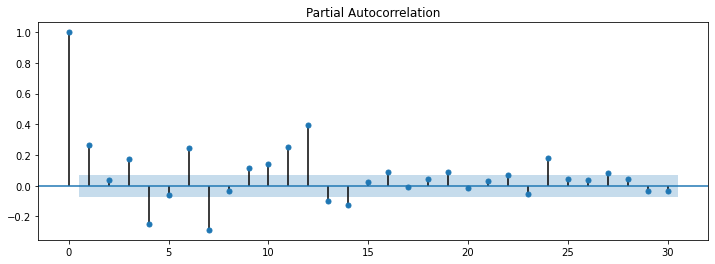

In [941]:
from statsmodels.graphics.tsaplots import plot_pacf
plt.figure(figsize=(12,4))
plot_pacf(train['Sales'], ax=plt.gca(), lags = 30)
plt.show()

#### ARIMA MODEL

In [942]:
model = ARIMA(train_boxcox['Sales'], order=(12, 1, 4))
model_fit = model.fit()
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Sales   No. Observations:                  741
Model:                ARIMA(12, 1, 4)   Log Likelihood                 -44.039
Method:                       css-mle   S.D. of innovations              0.255
Date:                Mon, 12 Apr 2021   AIC                            124.078
Time:                        17:13:34   BIC                            207.022
Sample:                    01-02-2013   HQIC                           156.056
                         - 01-12-2015                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.0004      0.000      2.350      0.019    6.96e-05       0.001
ar.L1.D.Sales      0.2154      0.103      2.090      0.037       0.013       0.417
ar.L2.D.Sales     -0.3656      0.088

##### Recover the orginal time series

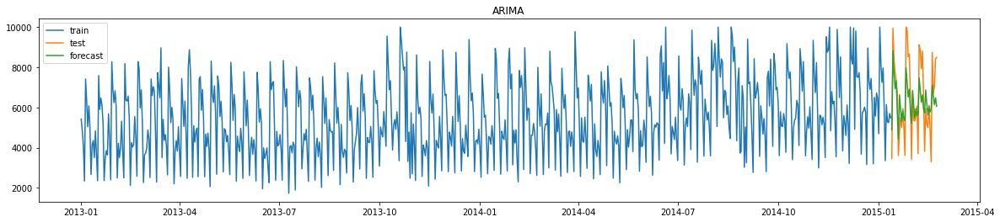

In [943]:
y_hat_ar = store_tsdf[2]['Sales'].copy()
y_hat_ar['ar_forecast_boxcox_diff'] = model_fit.predict(start = test.index.min(), end = test.index.max())
y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox_diff'].cumsum()
y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox'].add(train_boxcox['Sales'][0])
y_hat_ar['ar_forecast'] = np.exp(y_hat_ar['ar_forecast_boxcox'])

graph(y_hat_ar['ar_forecast'],"ARIMA")

##### Calculate RMSE and MAPE

In [944]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_ar['ar_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_ar['ar_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_13_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Check for granger Causality Test

In [945]:
grangers_causality_matrix(train,variables = train.columns)

,Sales_x,Customers_x,DayOfWeek_x,Promo_x,SchoolHoliday_x,StateHoliday_x
Sales_y,1.0000,0.0,0.0,0.000,0.0,1.0
Customers_y,0.0000,1.0,0.0,0.000,0.0,1.0
DayOfWeek_y,0.0000,0.0,1.0,0.000,0.0,1.0
Promo_y,0.0000,0.0,0.0,1.000,0.0,1.0
SchoolHoliday_y,0.0004,0.0,0.0,0.001,1.0,1.0
StateHoliday_y,NaN,NaN,NaN,NaN,NaN,NaN


#### VAR model

In [946]:

mod = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']], order=(3,0), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())
#Note the AIC value - lower AIC => better model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  742
Model:                             VAR(3)   Log Likelihood                 616.133
Date:                    Mon, 12 Apr 2021   AIC                          -1202.265
Time:                            17:13:53   BIC                          -1133.125
Sample:                        01-01-2013   HQIC                         -1175.611
                             - 01-12-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              777.43, 253.98   Jarque-Bera (JB):           7.11, 1.18
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.03, 0.55
Heteroskedasticity (H):         0.64, 0.81   Skew:                      -0.22, 0.09
Prob(H) (two-sided):            0.00, 0.09   Kurtosis:                   3.18, 2.93


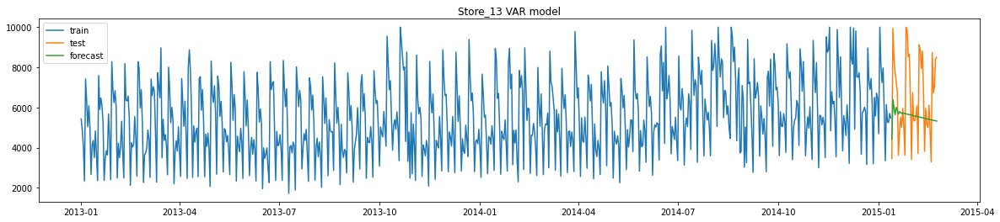

In [947]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_var = mod.fit().predict(start=start_index, end=end_index)
y_hat_var = np.exp(y_hat_var)
graph(y_hat_var['Sales'],"Store_13 VAR model")


In [948]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'])).round(2)
#print('Income: RMSE:',  rmse)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_var['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_13_VAR'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results



,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Johansen cointegration Test

In [949]:
coint=coint_johansen(np.asarray(train_boxcox[['Sales','Customers']]),0,1)
# coint.trace_stat
# coint.max_eig_stat
traces = coint.lr1
maxeig=coint.lr2
cvts = coint.cvt  ## 0: 90%  1:95% 2: 99%
cvms = coint.cvm   ## 0: 90%  1:95% 2: 99%

N, l = np.asarray(train[['Sales','Customers']]).shape

for i in range(l):
    if traces[i] > cvts[i, 1]:
        r = i + 1
print(r)

2


Observation:
- No cointgeration
- Both series are stationary

#### VARMAX

In [950]:
exog = train['SchoolHoliday']
mod_varmax = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']],exog= exog, order=(5,4), trend='c')
resmax = mod_varmax.fit(maxiter=1000, disp=False)
print(resmax.summary())

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  742
Model:                        VARMAX(5,4)   Log Likelihood                 910.874
                              + intercept   AIC                          -1735.747
Date:                    Mon, 12 Apr 2021   BIC                          -1537.545
Time:                            17:15:19   HQIC                         -1659.338
Sample:                        01-01-2013                                         
                             - 01-12-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              408.01, 124.54   Jarque-Bera (JB):         14.43, 12.04
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.86, 0.83   Skew:                     -0.31, -0.02
P

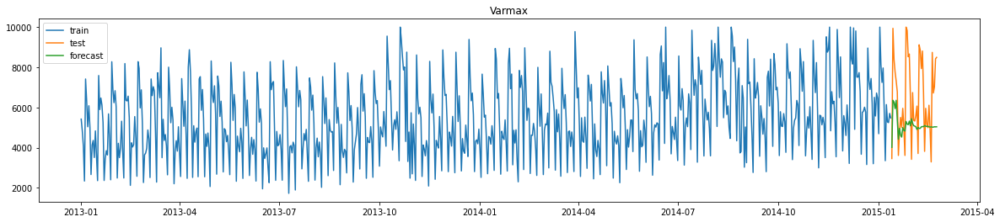

In [951]:
# forecast
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
#y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = exog[-42:])
y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)
graph(y_hat_varmax['Sales'],"Varmax")


In [952]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'])).round(2)
#print('Income: RMSE:',  rmse)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_varmax['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_13_VARMAX_SchoolHoliday'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


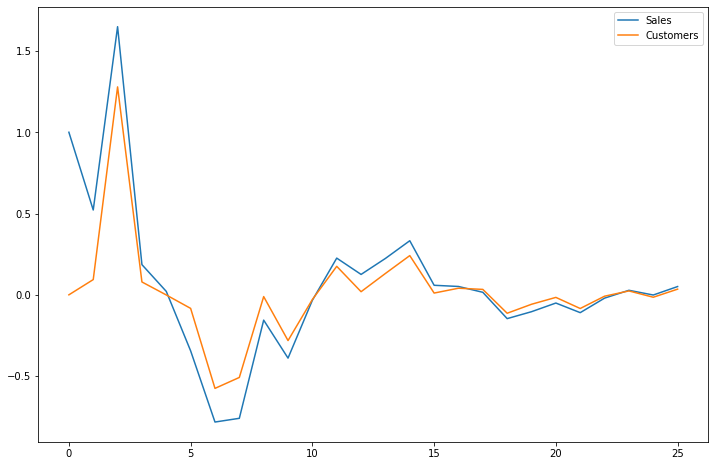

In [953]:
irf = resmax.impulse_responses(steps = 25, orthogonalized= False)
irf.plot()

## EDA, Model Building and Forecasting for Store 25

### EDA:Store wise analysis

<Figure size 1440x288 with 0 Axes>

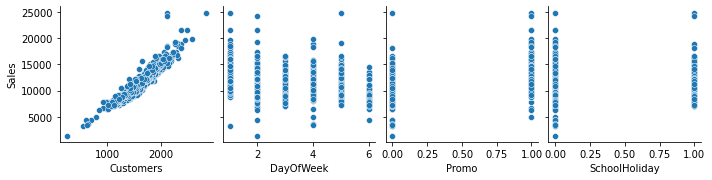

In [954]:
# Analysis relation between sales and variables
plt.figure(figsize= [20,4])

sns.pairplot(store_df[5], x_vars= ['Customers','DayOfWeek', 'Promo', 'SchoolHoliday'],y_vars = ["Sales"],)

plt.show()
  

Observation:
- A strong relation can be seen between Sales and Customers
- Tower of Sales are  higher on weekend compare to weekdays.
- Minimum value of sale is higher when promotion is done.

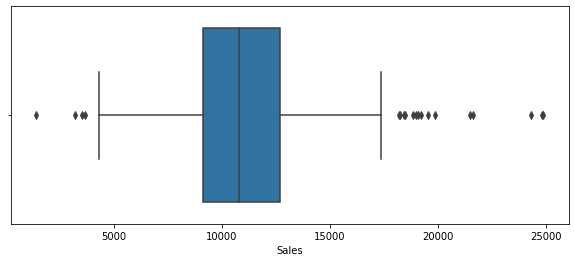

In [955]:
 # Analyse spread of Sales

plt.figure(figsize= [10,4])
sns.boxplot(store_df[5]['Sales'])
 
plt.show()

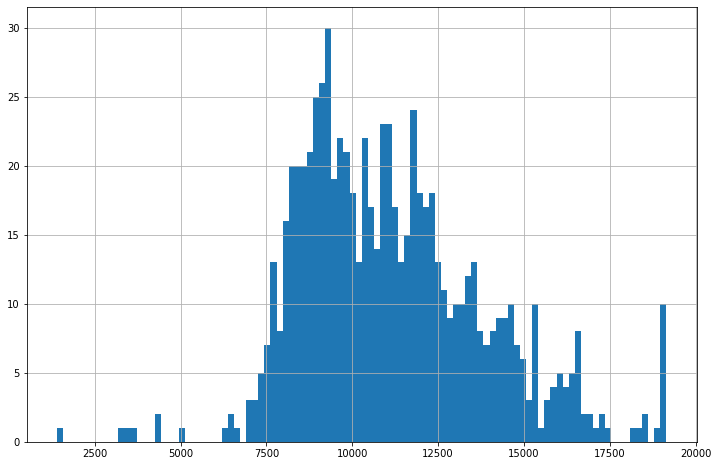

In [956]:
# distribution of Sales density 
store_tsdf[5]['Sales'].hist(bins= 100)
plt.show()

Observation:
- Most of the sales value lies between 3000 to 6000.
- Sales peak are at 4000 and 4600 around. 

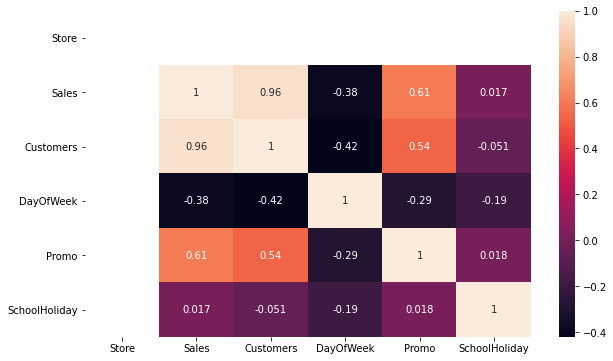

In [957]:
# analyse correlation

plt.figure(figsize=[10,6])
sns.heatmap(store_tsdf[5].corr(),annot=True)
plt.show()

Obsevation:
- Very high correlation between Sales and Customers
- Good correlation between Promo and Sales.

#### Decompostion of time series Data 

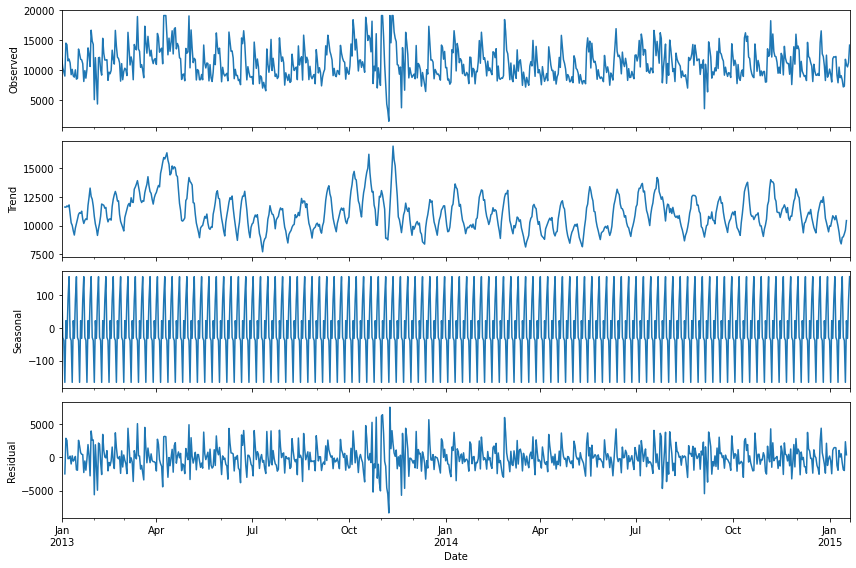

In [958]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize']  =12,8
decomposition = sm.tsa.seasonal_decompose(store_tsdf[5]['Sales'],model = 'additive')
fig = decomposition.plot()
plt.show()

### Data preparation

#### Split the time series data into test and train

In [959]:
# first two and half years as training set
# last six weeks as test set (means 42 days)
len(store_tsdf[2])

784

In [960]:

train = store_tsdf[2][['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][:-42]
test = store_tsdf[2][['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][-42:]

In [961]:
# inspect test and train 
len(train), len(test)

(742, 42)

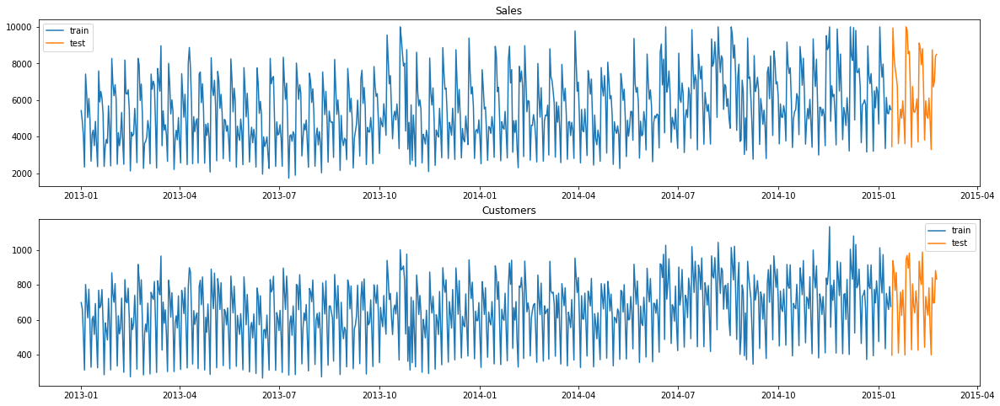

In [962]:
plt.figure(figsize = (20,8))
plt.subplot(211)
plt.plot(train['Sales'],label = 'train')
plt.plot(test['Sales'], label = 'test')
plt.title('Sales')
plt.legend(loc = 'best')

plt.subplot(212)
plt.plot(train['Customers'],label = 'train')
plt.plot(test['Customers'],label = 'test')
plt.title('Customers')
plt.legend(loc = 'best')
plt.show()

#### Standardize the train data

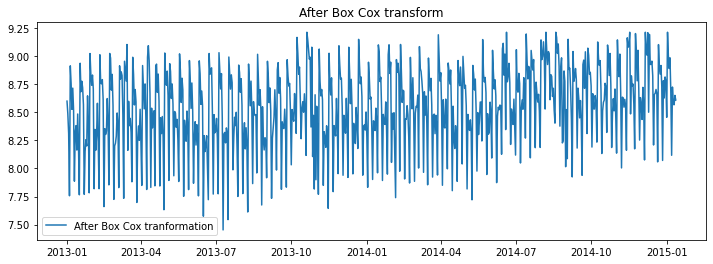

In [963]:
from scipy.stats import boxcox
train_boxcox = pd.DataFrame(boxcox(train['Sales'], lmbda=0), index = train.index, columns=['Sales'])
train_boxcox['Customers'] =  pd.Series(boxcox(train['Customers'], lmbda=0), index = train.index)

# plotting Sales after boxcox transformation
plt.figure(figsize=(12,4))
plt.plot(train_boxcox['Sales'], label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

#### Check for Stationarity

In [964]:
# Augmented Dickey Fuller test(ADF)
from statsmodels.tsa.stattools import adfuller

# Sales
adf_test = adfuller(train['Sales'])

print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])


ADF Test for SALES
ADF Statistics: -3.178
Critical value @ 0.05: -2.87
p-value: 0.021270


ADF Test for CUSTOMERS
ADF Statistics: -2.915
Critical value @ 0.05: -2.87
p-value: 0.043600


In [965]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test
from statsmodels.tsa.stattools import kpss
kpss_test = kpss(train['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

kpss_test = kpss(train['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 2.143698
Critical Values @ 0.05: 0.46
p-value: 0.010000


KPSS test for Customers
KPSS Statistic: 2.369524
Critical Values @ 0.05: 0.46
p-value: 0.010000


Observation:
- Training dataset is stationary

### Model Building

#### AutoCorrelation function

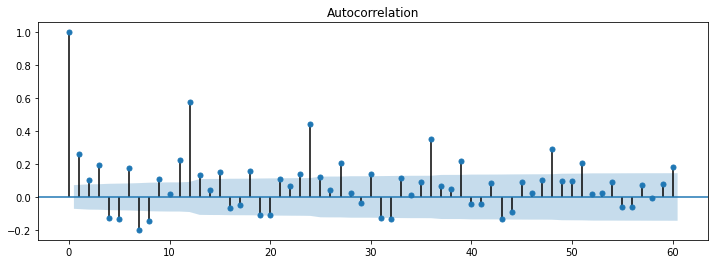

In [966]:
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12,4))
plot_acf(train['Sales'], ax=plt.gca(), lags = 60)
plt.show()

#### Partial AutoCorrelation function.

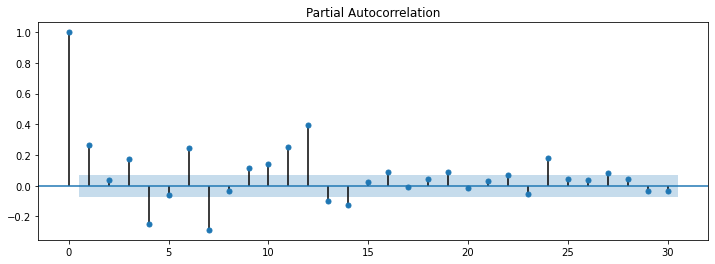

In [967]:
from statsmodels.graphics.tsaplots import plot_pacf
plt.figure(figsize=(12,4))
plot_pacf(train['Sales'], ax=plt.gca(), lags = 30)
plt.show()

#### ARIMA MODEL

In [968]:
model = ARIMA(train_boxcox['Sales'], order=(12, 1, 4))
model_fit = model.fit()
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Sales   No. Observations:                  741
Model:                ARIMA(12, 1, 4)   Log Likelihood                 -44.039
Method:                       css-mle   S.D. of innovations              0.255
Date:                Mon, 12 Apr 2021   AIC                            124.078
Time:                        17:18:30   BIC                            207.022
Sample:                    01-02-2013   HQIC                           156.056
                         - 01-12-2015                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.0004      0.000      2.350      0.019    6.96e-05       0.001
ar.L1.D.Sales      0.2154      0.103      2.090      0.037       0.013       0.417
ar.L2.D.Sales     -0.3656      0.088

##### Recover the orginal time series

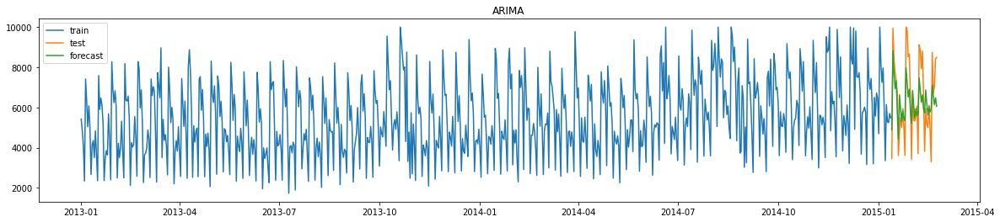

In [969]:
y_hat_ar = store_tsdf[2]['Sales'].copy()
y_hat_ar['ar_forecast_boxcox_diff'] = model_fit.predict(start = test.index.min(), end = test.index.max())
y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox_diff'].cumsum()
y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox'].add(train_boxcox['Sales'][0])
y_hat_ar['ar_forecast'] = np.exp(y_hat_ar['ar_forecast_boxcox'])

graph(y_hat_ar['ar_forecast'],"ARIMA")

##### Calculate RMSE and MAPE

In [970]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_ar['ar_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_ar['ar_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_25_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Check for granger Causality Test

In [971]:
grangers_causality_matrix(train,variables = train.columns)

,Sales_x,Customers_x,DayOfWeek_x,Promo_x,SchoolHoliday_x,StateHoliday_x
Sales_y,1.0000,0.0,0.0,0.000,0.0,1.0
Customers_y,0.0000,1.0,0.0,0.000,0.0,1.0
DayOfWeek_y,0.0000,0.0,1.0,0.000,0.0,1.0
Promo_y,0.0000,0.0,0.0,1.000,0.0,1.0
SchoolHoliday_y,0.0004,0.0,0.0,0.001,1.0,1.0
StateHoliday_y,NaN,NaN,NaN,NaN,NaN,NaN


#### VAR model

In [972]:

mod = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']], order=(3,0), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())
#Note the AIC value - lower AIC => better model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  742
Model:                             VAR(3)   Log Likelihood                 616.133
Date:                    Mon, 12 Apr 2021   AIC                          -1202.265
Time:                            17:19:02   BIC                          -1133.125
Sample:                        01-01-2013   HQIC                         -1175.611
                             - 01-12-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              777.43, 253.98   Jarque-Bera (JB):           7.11, 1.18
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.03, 0.55
Heteroskedasticity (H):         0.64, 0.81   Skew:                      -0.22, 0.09
Prob(H) (two-sided):            0.00, 0.09   Kurtosis:                   3.18, 2.93


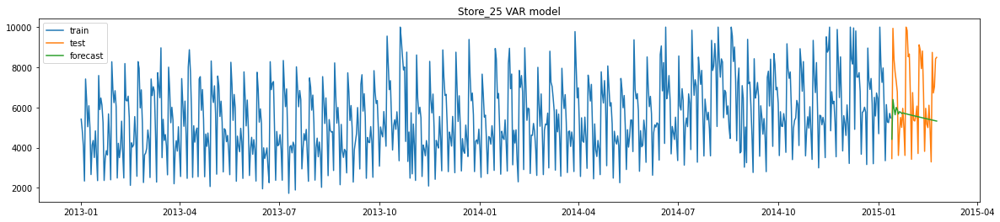

In [973]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_var = mod.fit().predict(start=start_index, end=end_index)
y_hat_var = np.exp(y_hat_var)
graph(y_hat_var['Sales'],"Store_25 VAR model")


In [974]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'])).round(2)
#print('Income: RMSE:',  rmse)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_var['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_25_VAR'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results



,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Johansen cointegration Test

In [975]:
coint=coint_johansen(np.asarray(train_boxcox[['Sales','Customers']]),0,1)
# coint.trace_stat
# coint.max_eig_stat
traces = coint.lr1
maxeig=coint.lr2
cvts = coint.cvt  ## 0: 90%  1:95% 2: 99%
cvms = coint.cvm   ## 0: 90%  1:95% 2: 99%

N, l = np.asarray(train[['Sales','Customers']]).shape

for i in range(l):
    if traces[i] > cvts[i, 1]:
        r = i + 1
print(r)

2


Observation:
- No cointgeration
- Both series are stationary

#### VARMAX

In [976]:
exog = train['SchoolHoliday']
mod_varmax = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']],exog= exog, order=(8,8), trend='c')
resmax = mod_varmax.fit(maxiter=1000, disp=False)
print(resmax.summary())

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  742
Model:                        VARMAX(8,8)   Log Likelihood                1115.525
                              + intercept   AIC                          -2089.049
Date:                    Mon, 12 Apr 2021   BIC                          -1761.786
Time:                            17:24:31   HQIC                         -1962.885
Sample:                        01-01-2013                                         
                             - 01-12-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                69.35, 38.86   Jarque-Bera (JB):        240.45, 97.51
Prob(Q):                        0.00, 0.52   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.93, 0.86   Skew:                     -0.11, -0.13
P

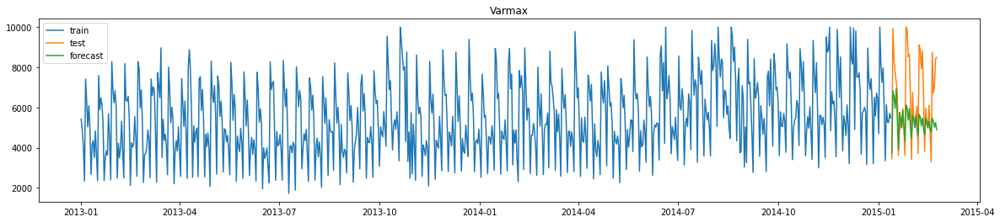

In [977]:
# forecast
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
#y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = exog[-42:])
y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

graph(y_hat_varmax['Sales'],"Varmax")


In [978]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'])).round(2)
#print('Income: RMSE:',  rmse)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_varmax['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_25_VARMAX_SchoolHoliday'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


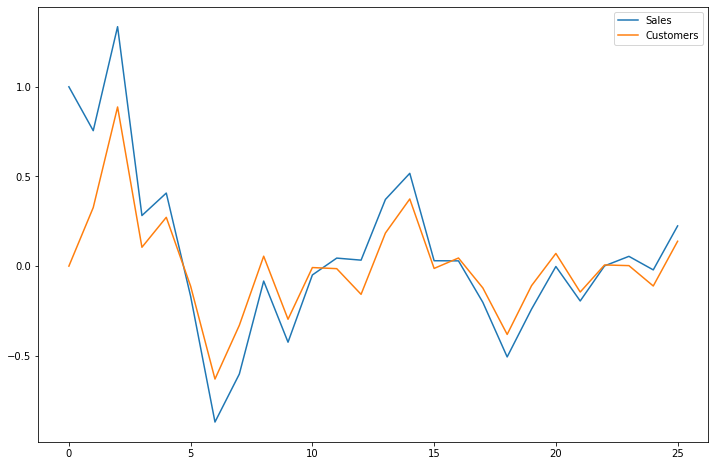

In [979]:
irf = resmax.impulse_responses(steps = 25, orthogonalized= False)
irf.plot()

## EDA, Model Building and Forecasting for Store 29

### EDA:Store wise analysis

<Figure size 1440x288 with 0 Axes>

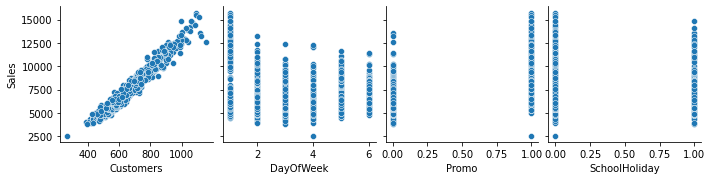

In [980]:
# Analysis relation between sales and variables
plt.figure(figsize= [20,4])

sns.pairplot(store_df[6], x_vars= ['Customers','DayOfWeek', 'Promo', 'SchoolHoliday'],y_vars = ["Sales"],)

plt.show()
  

Observation:
- A strong relation can be seen between Sales and Customers
- Tower of Sales are  higher on weekend compare to weekdays.
- Minimum value of sale is higher when promotion is done.

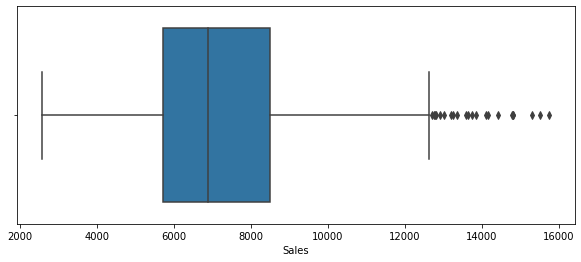

In [981]:
 # Analyse spread of Sales

plt.figure(figsize= [10,4])
sns.boxplot(store_df[6]['Sales'])
 
plt.show()

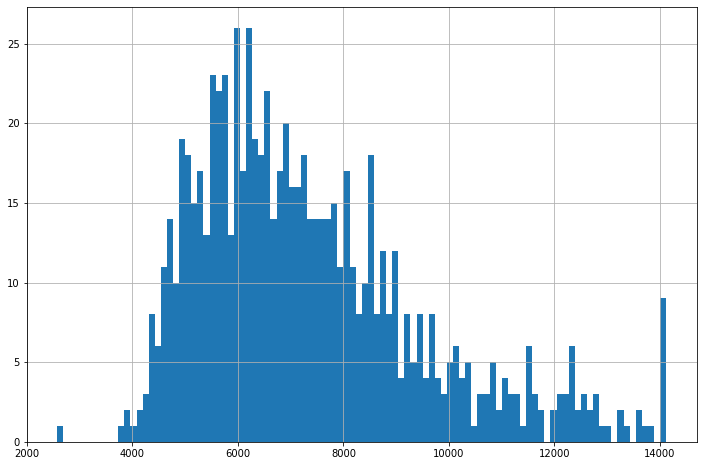

In [982]:
# distribution of Sales density 
store_tsdf[6]['Sales'].hist(bins= 100)
plt.show()

Observation:
- Most of the sales value lies between 3000 to 6000.
- Sales peak are at 4000 and 4600 around. 

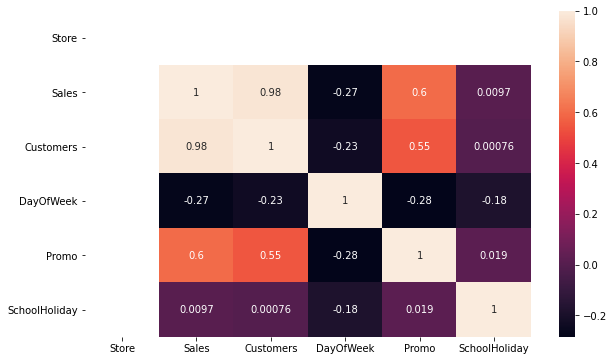

In [983]:
# analyse correlation

plt.figure(figsize=[10,6])
sns.heatmap(store_tsdf[6].corr(),annot=True)
plt.show()

Obsevation:
- Very high correlation between Sales and Customers
- Good correlation between Promo and Sales.

#### Decompostion of time series Data 

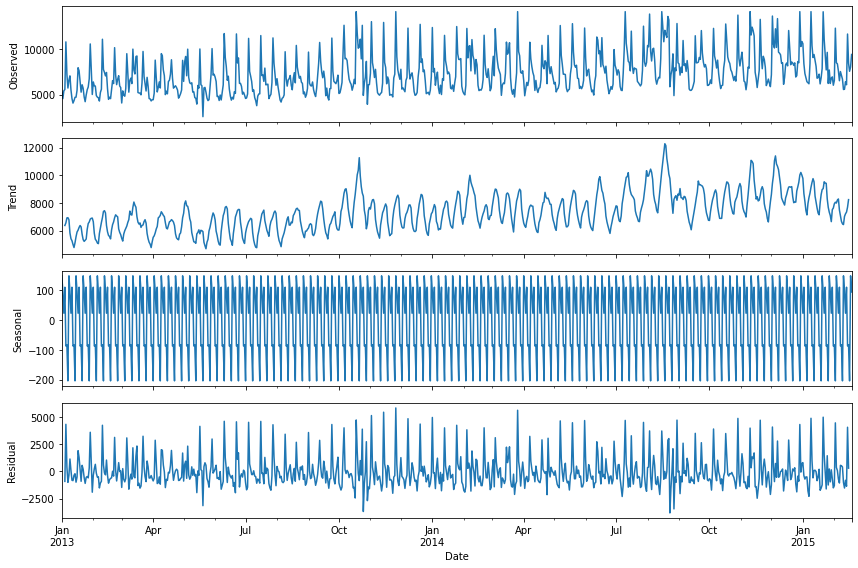

In [984]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize']  =12,8
decomposition = sm.tsa.seasonal_decompose(store_tsdf[6]['Sales'],model = 'additive')
fig = decomposition.plot()
plt.show()

### Data preparation

#### Split the time series data into test and train

In [985]:
# first two and half years as training set
# last six weeks as test set (means 42 days)
len(store_tsdf[6])

779

In [986]:

train = store_tsdf[6][['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][:-42]
test = store_tsdf[6][['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][-42:]

In [987]:
# inspect test and train 
len(train), len(test)

(737, 42)

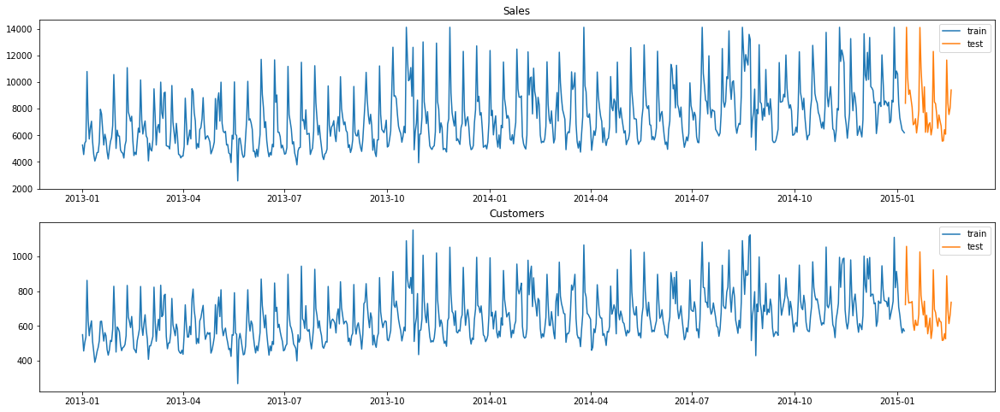

In [988]:
plt.figure(figsize = (20,8))
plt.subplot(211)
plt.plot(train['Sales'],label = 'train')
plt.plot(test['Sales'], label = 'test')
plt.title('Sales')
plt.legend(loc = 'best')

plt.subplot(212)
plt.plot(train['Customers'],label = 'train')
plt.plot(test['Customers'],label = 'test')
plt.title('Customers')
plt.legend(loc = 'best')
plt.show()

#### Standardize the train data

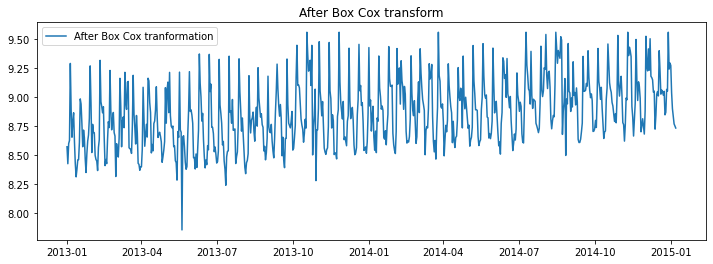

In [989]:
from scipy.stats import boxcox
train_boxcox = pd.DataFrame(boxcox(train['Sales'], lmbda=0), index = train.index, columns=['Sales'])
train_boxcox['Customers'] =  pd.Series(boxcox(train['Customers'], lmbda=0), index = train.index)

# plotting Sales after boxcox transformation
plt.figure(figsize=(12,4))
plt.plot(train_boxcox['Sales'], label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

#### Check for Stationarity

In [990]:
# Augmented Dickey Fuller test(ADF)
from statsmodels.tsa.stattools import adfuller

# Sales
adf_test = adfuller(train_boxcox['Sales'])

print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train_boxcox['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])


ADF Test for SALES
ADF Statistics: -3.978
Critical value @ 0.05: -2.87
p-value: 0.001529


ADF Test for CUSTOMERS
ADF Statistics: -3.659
Critical value @ 0.05: -2.87
p-value: 0.004732


In [991]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test
from statsmodels.tsa.stattools import kpss
kpss_test = kpss(train_boxcox['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

kpss_test = kpss(train_boxcox['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 2.795703
Critical Values @ 0.05: 0.46
p-value: 0.010000


KPSS test for Customers
KPSS Statistic: 2.827878
Critical Values @ 0.05: 0.46
p-value: 0.010000


Observation:
- Through KPSS test training dataset appears non stationary.

#### Differenceing to remove trend 

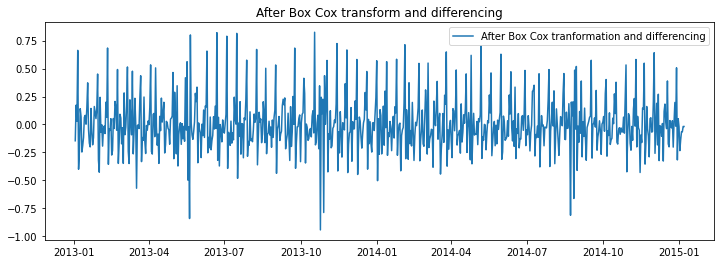

In [992]:
train_boxcox_diff = pd.DataFrame(pd.Series(train_boxcox['Sales'] - train_boxcox['Sales'].shift(), train.index))
train_boxcox_diff['Sales'] = train_boxcox_diff
train_boxcox_diff['Customers'] = train_boxcox['Customers'] - train_boxcox['Customers'].shift()
train_boxcox_diff.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(train_boxcox_diff['Sales'], label='After Box Cox tranformation and differencing')
plt.legend(loc='best')
plt.title('After Box Cox transform and differencing')
plt.show()

#### Check for stationarity after differencing

In [993]:
# Augmented Dickey Fuller test(ADF)
from statsmodels.tsa.stattools import adfuller

# Sales
adf_test = adfuller(train_boxcox_diff['Sales'])

print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train_boxcox_diff['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Test for SALES
ADF Statistics: -10.674
Critical value @ 0.05: -2.87
p-value: 0.000000


ADF Test for CUSTOMERS
ADF Statistics: -10.198
Critical value @ 0.05: -2.87
p-value: 0.000000


In [994]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test
from statsmodels.tsa.stattools import kpss
kpss_test = kpss(train_boxcox_diff['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

kpss_test = kpss(train_boxcox_diff['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 0.022444
Critical Values @ 0.05: 0.46
p-value: 0.100000


KPSS test for Customers
KPSS Statistic: 0.021876
Critical Values @ 0.05: 0.46
p-value: 0.100000


Observation :
- Now the training dataset is stationary.

### Model Building

#### AutoCorrelation function

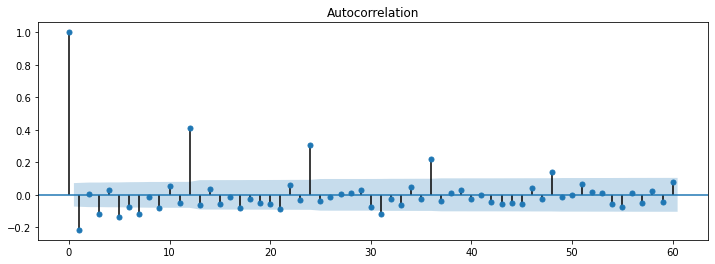

In [995]:
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12,4))
plot_acf(train_boxcox_diff['Sales'], ax=plt.gca(), lags = 60)
plt.show()

#### Partial AutoCorrelation function.

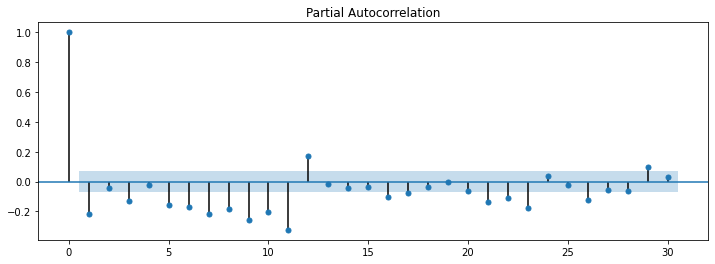

In [996]:
from statsmodels.graphics.tsaplots import plot_pacf
plt.figure(figsize=(12,4))
plot_pacf(train_boxcox_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

#### ARIMA MODEL

In [997]:
model = ARIMA(train_boxcox_diff['Sales'], order=(1,0,1))
model_fit = model.fit()
print(model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  736
Model:                     ARMA(1, 1)   Log Likelihood                  89.304
Method:                       css-mle   S.D. of innovations              0.214
Date:                Mon, 12 Apr 2021   AIC                           -170.607
Time:                        17:24:38   BIC                           -152.202
Sample:                    01-02-2013   HQIC                          -163.509
                         - 01-07-2015                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.0005   8.14e-05      6.724      0.000       0.000       0.001
ar.L1.Sales     0.5481      0.031     17.715      0.000       0.487       0.609
ma.L1.Sales    -1.0000      0.003   -285.959    

##### Recover the orginal time series

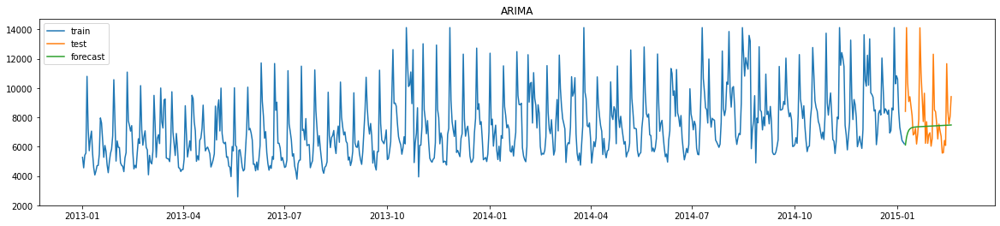

In [998]:
y_hat_ar = store_tsdf[6]['Sales'].copy()
y_hat_ar['ar_forecast_boxcox_diff'] = model_fit.predict(start = test.index.min(), end = test.index.max())
y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox_diff'].cumsum()
y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox'].add(train_boxcox['Sales'][0])
y_hat_ar['ar_forecast'] = np.exp(y_hat_ar['ar_forecast_boxcox'])

graph(y_hat_ar['ar_forecast'],"ARIMA")

##### Calculate RMSE and MAPE

In [999]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_ar['ar_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_ar['ar_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_29_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Check for granger Causality Test

In [1000]:
grangers_causality_matrix(train,variables = train.columns)

,Sales_x,Customers_x,DayOfWeek_x,Promo_x,SchoolHoliday_x,StateHoliday_x
Sales_y,1.0,0.0,0.0,0.0,0.0,1.0
Customers_y,0.0,1.0,0.0,0.0,0.0,1.0
DayOfWeek_y,0.0,0.0,1.0,0.0,0.0,1.0
Promo_y,0.0,0.0,0.0,1.0,0.0,1.0
SchoolHoliday_y,0.0,0.0,0.0,0.0,1.0,1.0
StateHoliday_y,NaN,NaN,NaN,NaN,NaN,NaN


#### VAR model

In [1001]:

mod = sm.tsa.VARMAX(train_boxcox_diff[['Sales', 'Customers']], order=(12,0), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())
#Note the AIC value - lower AIC => better model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  736
Model:                            VAR(12)   Log Likelihood                1529.298
Date:                    Mon, 12 Apr 2021   AIC                          -2956.596
Time:                            17:25:25   BIC                          -2721.934
Sample:                        01-02-2013   HQIC                         -2866.096
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                79.99, 20.27   Jarque-Bera (JB):         85.39, 16.94
Prob(Q):                        0.00, 1.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.94, 1.13   Skew:                      0.26, -0.02
Prob(H) (two-sided):            0.61, 0.36   Kurtosis:                   4.58, 3.74


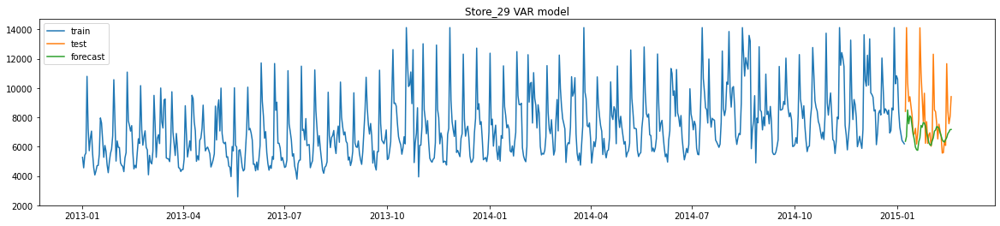

In [1002]:


start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_var = mod.fit().predict(start=start_index, end=end_index)
y_hat_var['Sales'] = y_hat_var['Sales'].cumsum()
y_hat_var['Sales'] = y_hat_var['Sales'].add(train_boxcox['Sales'][0])
y_hat_var['Sales'] = np.exp(y_hat_var['Sales'])

graph(y_hat_var['Sales'],"Store_29 VAR model")


In [1003]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'])).round(2)
#print('Income: RMSE:',  rmse)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_var['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_29_VAR'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results



,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Johansen cointegration Test

In [1004]:
coint=coint_johansen(np.asarray(train_boxcox_diff[['Sales','Customers']]),0,1)
# coint.trace_stat
# coint.max_eig_stat
traces = coint.lr1
maxeig=coint.lr2
cvts = coint.cvt  ## 0: 90%  1:95% 2: 99%
cvms = coint.cvm   ## 0: 90%  1:95% 2: 99%

N, l = np.asarray(train[['Sales','Customers']]).shape

for i in range(l):
    if traces[i] > cvts[i, 1]:
        r = i + 1
print(r)

2


Observation:
- No cointgeration
- Both series are stationary

#### VARMAX

In [1005]:
exog = train['SchoolHoliday']
mod_varmax = sm.tsa.VARMAX(train_boxcox_diff[['Sales', 'Customers']],exog= exog[1:], order=(12,1), trend='c')
resmax = mod_varmax.fit(maxiter=1000, disp=False)
print(resmax.summary())

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  736
Model:                       VARMAX(12,1)   Log Likelihood                1533.825
                              + intercept   AIC                          -2949.650
Date:                    Mon, 12 Apr 2021   BIC                          -2678.177
Time:                            17:34:19   HQIC                         -2844.954
Sample:                        01-02-2013                                         
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                78.92, 25.24   Jarque-Bera (JB):         84.38, 17.67
Prob(Q):                        0.00, 0.97   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.94, 1.12   Skew:                      0.28, -0.06
P

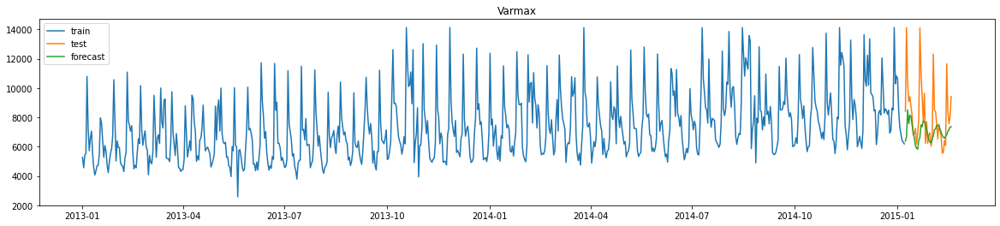

In [1007]:


# forecast
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
#y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = exog[-42:])
y_hat_varmax = pd.DataFrame()
y_hat_varmax[["Sales_boxcox_diff",'Customers_boxcox_diff']] = resmax.predict(start=start_index, end=end_index,exog = np.array(exog[-42:]).reshape(42,1))
y_hat_varmax['Sales_boxcox'] = y_hat_varmax['Sales_boxcox_diff'].cumsum()
y_hat_varmax['Sales_boxcox'] = y_hat_varmax['Sales_boxcox'].add(train_boxcox['Sales'][0])
y_hat_varmax['Sales'] = np.exp(y_hat_varmax['Sales_boxcox'])

graph(y_hat_varmax['Sales'],"Varmax")

In [1008]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'])).round(2)
#print('Income: RMSE:',  rmse)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_varmax['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_29_VARMAX_SchoolHoliday'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


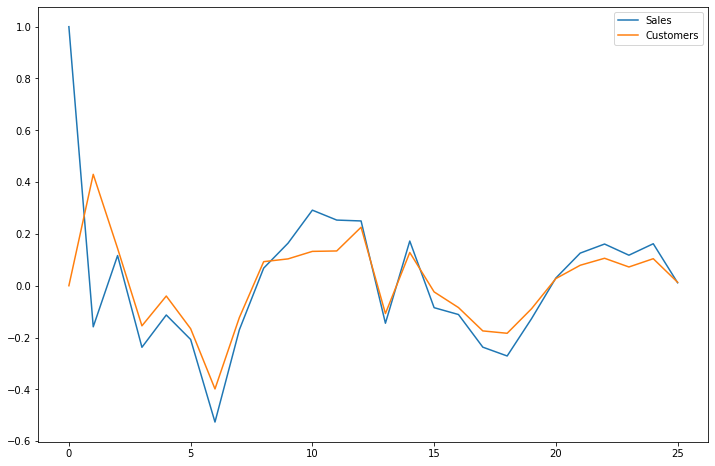

In [1009]:
irf = resmax.impulse_responses(steps = 25, orthogonalized= False)
irf.plot()

## EDA, Model Building and Forecasting for Store 31

### EDA:Store wise analysis

<Figure size 1440x288 with 0 Axes>

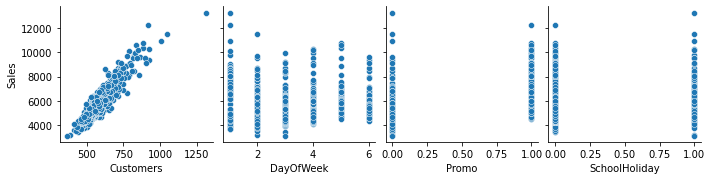

In [1010]:
# Analysis relation between sales and variables
plt.figure(figsize= [20,4])

sns.pairplot(store_df[7], x_vars= ['Customers','DayOfWeek', 'Promo', 'SchoolHoliday'],y_vars = ["Sales"],)

plt.show()
  

Observation:
- A strong relation can be seen between Sales and Customers
- Tower of Sales are  higher on weekend compare to weekdays.
- Minimum value of sale is higher when promotion is done.

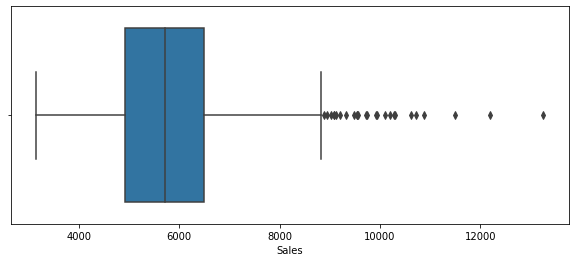

In [1011]:
 # Analyse spread of Sales

plt.figure(figsize= [10,4])
sns.boxplot(store_df[7]['Sales'])
 
plt.show()

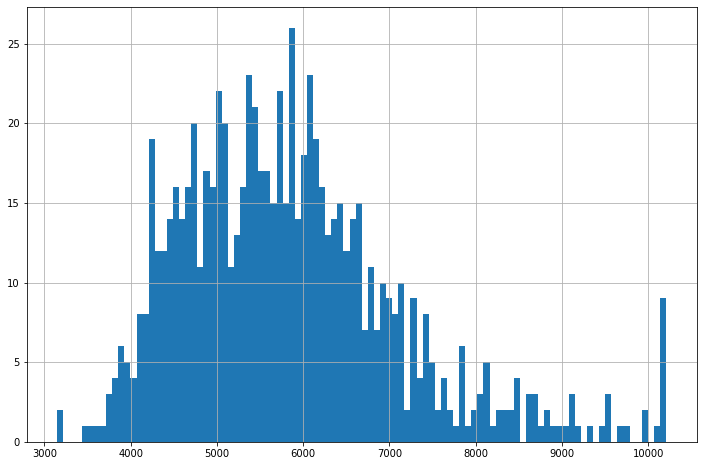

In [1012]:
# distribution of Sales density 
store_tsdf[7]['Sales'].hist(bins= 100)
plt.show()

Observation:
- Most of the sales value lies between 3000 to 6000.
- Sales peak are at 4000 and 4600 around. 

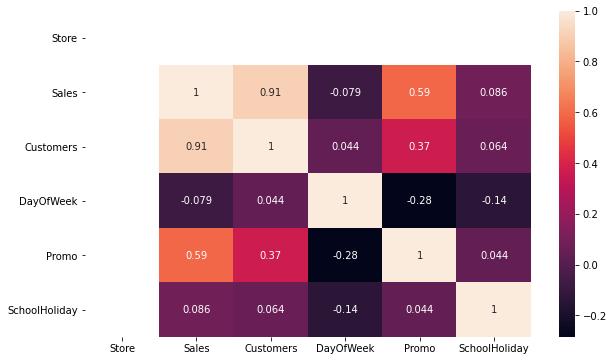

In [1013]:
# analyse correlation

plt.figure(figsize=[10,6])
sns.heatmap(store_tsdf[7].corr(),annot=True)
plt.show()

Obsevation:
- Very high correlation between Sales and Customers
- Good correlation between Promo and Sales.

#### Decompostion of time series Data 

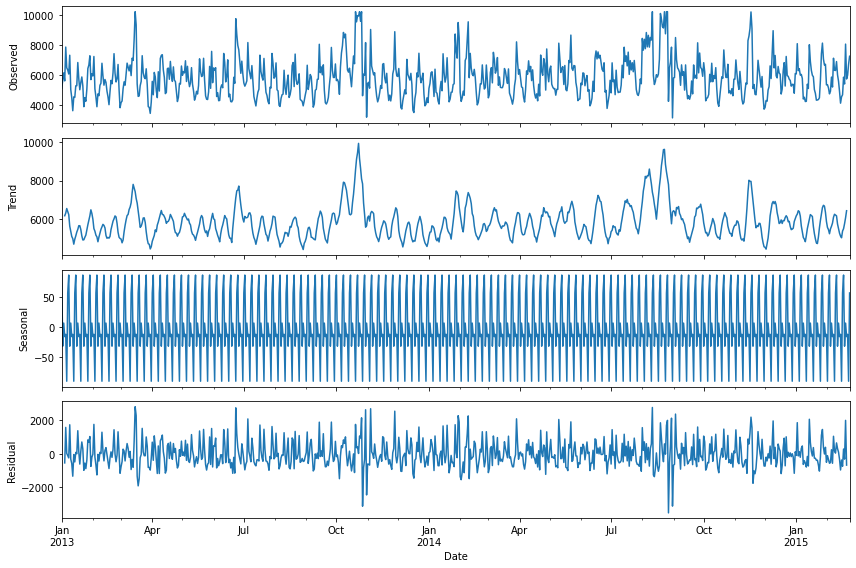

In [1014]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize']  =12,8
decomposition = sm.tsa.seasonal_decompose(store_tsdf[7]['Sales'],model = 'additive')
fig = decomposition.plot()
plt.show()

### Data preparation

#### Split the time series data into test and train

In [1015]:
# first two and half years as training set
# last six weeks as test set (means 42 days)
len(store_tsdf[7])

784

In [1016]:

train = store_tsdf[7][['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][:-42]
test = store_tsdf[7][['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][-42:]

In [1017]:
# inspect test and train 
len(train), len(test)

(742, 42)

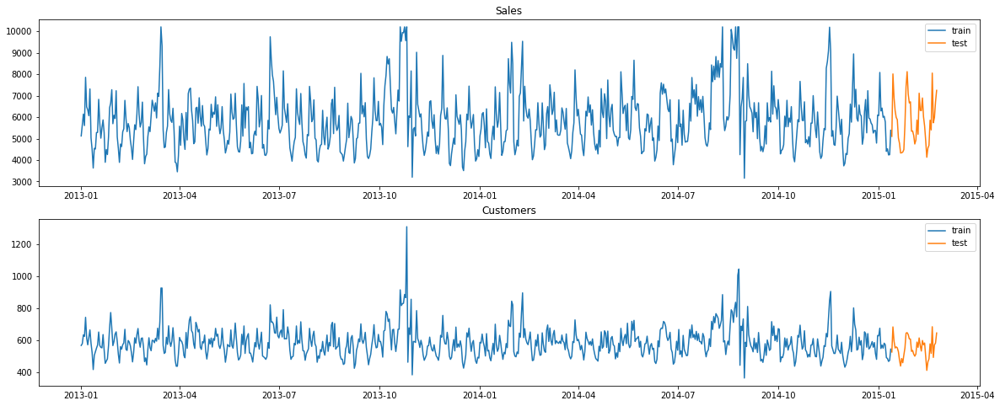

In [1018]:
plt.figure(figsize = (20,8))
plt.subplot(211)
plt.plot(train['Sales'],label = 'train')
plt.plot(test['Sales'], label = 'test')
plt.title('Sales')
plt.legend(loc = 'best')

plt.subplot(212)
plt.plot(train['Customers'],label = 'train')
plt.plot(test['Customers'],label = 'test')
plt.title('Customers')
plt.legend(loc = 'best')
plt.show()

#### Standardize the train data

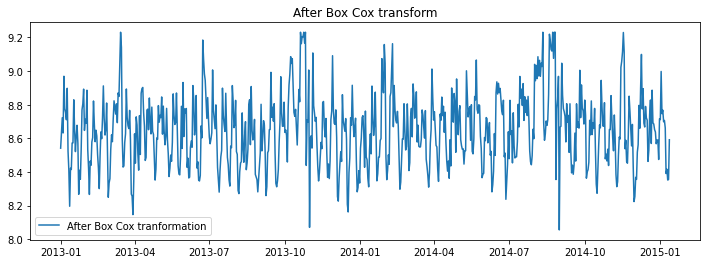

In [1019]:
from scipy.stats import boxcox
train_boxcox = pd.DataFrame(boxcox(train['Sales'], lmbda=0), index = train.index, columns=['Sales'])
train_boxcox['Customers'] =  pd.Series(boxcox(train['Customers'], lmbda=0), index = train.index)

# plotting Sales after boxcox transformation
plt.figure(figsize=(12,4))
plt.plot(train_boxcox['Sales'], label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

#### Check for Stationarity

In [1020]:
# Augmented Dickey Fuller test(ADF)
from statsmodels.tsa.stattools import adfuller

# Sales
adf_test = adfuller(train_boxcox['Sales'])

print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train_boxcox['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])


ADF Test for SALES
ADF Statistics: -6.019
Critical value @ 0.05: -2.87
p-value: 0.000000


ADF Test for CUSTOMERS
ADF Statistics: -6.240
Critical value @ 0.05: -2.87
p-value: 0.000000


In [1021]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test
from statsmodels.tsa.stattools import kpss
kpss_test = kpss(train_boxcox['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

kpss_test = kpss(train_boxcox['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 0.265931
Critical Values @ 0.05: 0.46
p-value: 0.100000


KPSS test for Customers
KPSS Statistic: 0.047162
Critical Values @ 0.05: 0.46
p-value: 0.100000


Observation:
- Training dataset is stationary

### Model Building

#### AutoCorrelation function

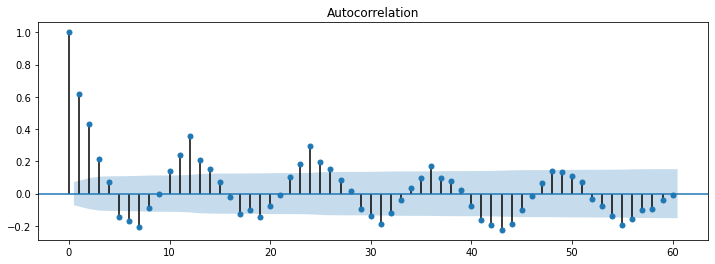

In [1022]:
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12,4))
plot_acf(train_boxcox['Sales'], ax=plt.gca(), lags = 60)
plt.show()

#### Partial AutoCorrelation function.

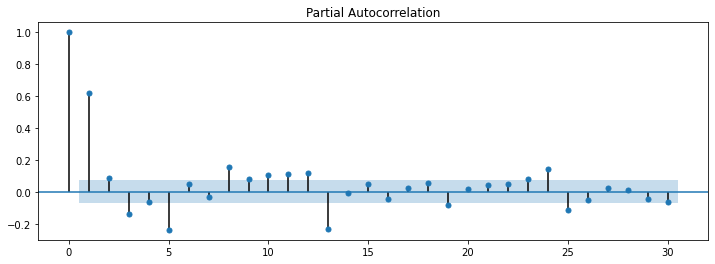

In [1023]:
from statsmodels.graphics.tsaplots import plot_pacf
plt.figure(figsize=(12,4))
plot_pacf(train_boxcox['Sales'], ax=plt.gca(), lags = 30)
plt.show()

#### ARIMA MODEL

In [1024]:
model = ARIMA(train_boxcox['Sales'], order=(8, 0, 7))
model_fit = model.fit()
print(model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  742
Model:                     ARMA(8, 7)   Log Likelihood                 356.227
Method:                       css-mle   S.D. of innovations              0.149
Date:                Mon, 12 Apr 2021   AIC                           -678.454
Time:                        17:34:44   BIC                           -600.096
Sample:                    01-01-2013   HQIC                          -648.246
                         - 01-12-2015                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           8.6515      0.014    616.091      0.000       8.624       8.679
ar.L1.Sales     0.4285      0.066      6.489      0.000       0.299       0.558
ar.L2.Sales    -0.3319      0.052     -6.408    

##### Recover the orginal time series

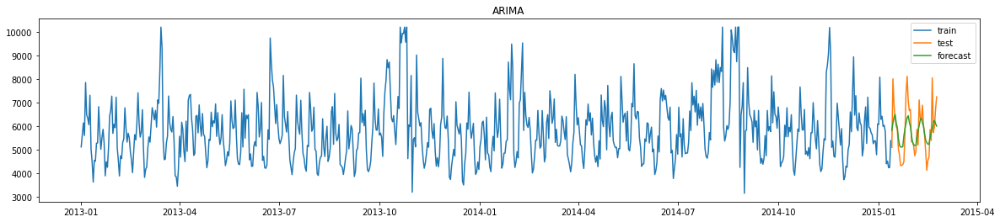

In [1025]:
y_hat_ar = store_tsdf[2]['Sales'].copy()
y_hat_ar['ar_forecast_boxcox'] = model_fit.predict(start = test.index.min(), end = test.index.max())
#y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox_diff'].cumsum()
#y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox'].add(train_boxcox['Sales'][0])
y_hat_ar['ar_forecast'] = np.exp(y_hat_ar['ar_forecast_boxcox'])

graph(y_hat_ar['ar_forecast'],"ARIMA")

##### Calculate RMSE and MAPE

In [1026]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_ar['ar_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_ar['ar_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_31_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Check for granger Causality Test

In [1027]:
grangers_causality_matrix(train,variables = train.columns)

,Sales_x,Customers_x,DayOfWeek_x,Promo_x,SchoolHoliday_x,StateHoliday_x
Sales_y,1.0000,0.0,0.0,0.000,0.0,1.0
Customers_y,0.0000,1.0,0.0,0.000,0.0,1.0
DayOfWeek_y,0.0000,0.0,1.0,0.000,0.0,1.0
Promo_y,0.0000,0.0,0.0,1.000,0.0,1.0
SchoolHoliday_y,0.0075,0.0,0.0,0.001,1.0,1.0
StateHoliday_y,NaN,NaN,NaN,NaN,NaN,NaN


#### VAR model

In [1028]:

mod = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']], order=(8,0), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())
#Note the AIC value - lower AIC => better model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  742
Model:                             VAR(8)   Log Likelihood                1507.426
Date:                    Mon, 12 Apr 2021   AIC                          -2944.852
Time:                            17:35:37   BIC                          -2783.525
Sample:                        01-01-2013   HQIC                         -2882.658
                             - 01-12-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               119.34, 48.86   Jarque-Bera (JB):       347.23, 771.00
Prob(Q):                        0.00, 0.16   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.16, 1.01   Skew:                      -0.39, 0.51
Prob(H) (two-sided):            0.25, 0.94   Kurtosis:                   6.26, 7.89


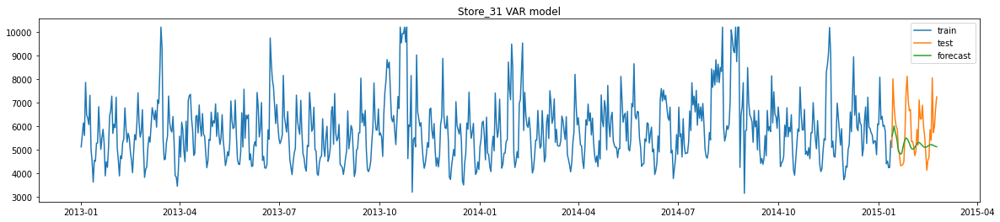

In [1029]:
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_var = mod.fit().predict(start=start_index, end=end_index)
y_hat_var = np.exp(y_hat_var)
graph(y_hat_var['Sales'],"Store_31 VAR model")


In [1030]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'])).round(2)
#print('Income: RMSE:',  rmse)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_var['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_31_VAR'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results



,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Johansen cointegration Test

In [1031]:
coint=coint_johansen(np.asarray(train_boxcox[['Sales','Customers']]),0,1)
# coint.trace_stat
# coint.max_eig_stat
traces = coint.lr1
maxeig=coint.lr2
cvts = coint.cvt  ## 0: 90%  1:95% 2: 99%
cvms = coint.cvm   ## 0: 90%  1:95% 2: 99%

N, l = np.asarray(train[['Sales','Customers']]).shape

for i in range(l):
    if traces[i] > cvts[i, 1]:
        r = i + 1
print(r)

2


Observation:
- No cointgeration
- Both series are stationary

#### VARMAX

In [1032]:
exog = train['SchoolHoliday']
mod_varmax = sm.tsa.VARMAX(train_boxcox[['Sales', 'Customers']],exog= exog, order=(8,7), trend='c')
resmax = mod_varmax.fit(maxiter=1000, disp=False)
print(resmax.summary())

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  742
Model:                        VARMAX(8,7)   Log Likelihood                1571.518
                              + intercept   AIC                          -3009.037
Date:                    Mon, 12 Apr 2021   BIC                          -2700.210
Time:                            17:46:44   HQIC                         -2889.980
Sample:                        01-01-2013                                         
                             - 01-12-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                77.82, 40.56   Jarque-Bera (JB):       109.51, 703.05
Prob(Q):                        0.00, 0.45   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.27, 1.10   Skew:                      -0.15, 0.55
P

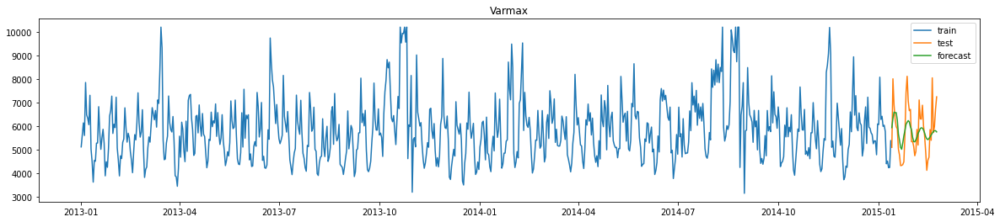

In [1033]:
# forecast
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
#y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = exog[-42:])
y_hat_varmax = resmax.predict(start=start_index, end=end_index,exog = np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)
graph(y_hat_varmax['Sales'],"Varmax")


In [1034]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'])).round(2)
#print('Income: RMSE:',  rmse)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_varmax['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_31_VARMAX_SchoolHoliday'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


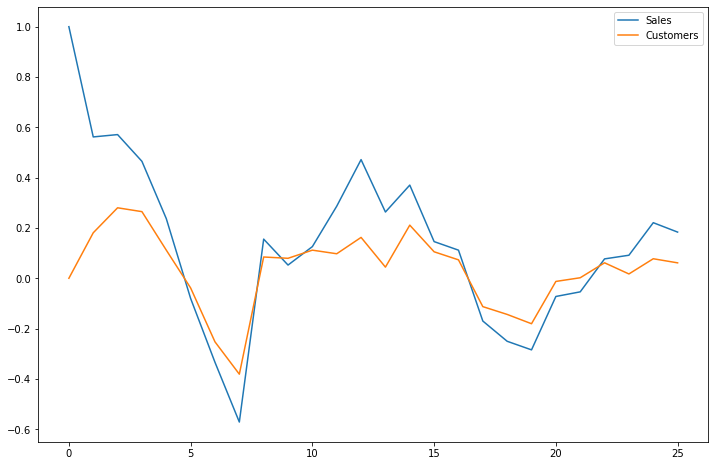

In [1035]:
irf = resmax.impulse_responses(steps = 25, orthogonalized= False)
irf.plot()

## EDA, Model Building and Forecasting for Store 46

### EDA:Store wise analysis

<Figure size 1440x288 with 0 Axes>

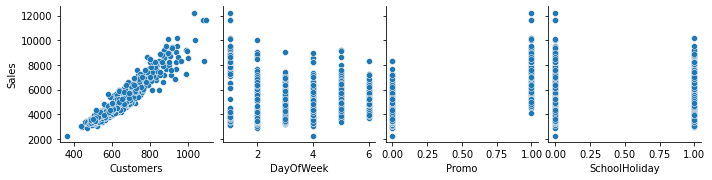

In [1036]:
# Analysis relation between sales and variables
plt.figure(figsize= [20,4])

sns.pairplot(store_df[8], x_vars= ['Customers','DayOfWeek', 'Promo', 'SchoolHoliday'],y_vars = ["Sales"],)

plt.show()
  

Observation:
- A strong relation can be seen between Sales and Customers
- Tower of Sales are  higher on weekend compare to weekdays.
- Minimum value of sale is higher when promotion is done.

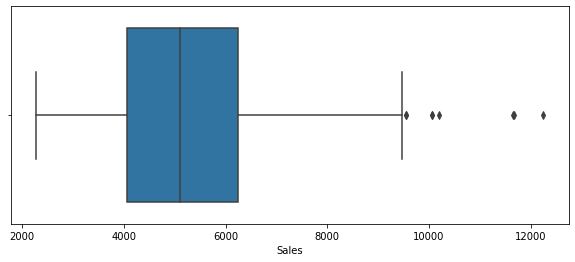

In [1037]:
 # Analyse spread of Sales

plt.figure(figsize= [10,4])
sns.boxplot(store_df[8]['Sales'])
 
plt.show()

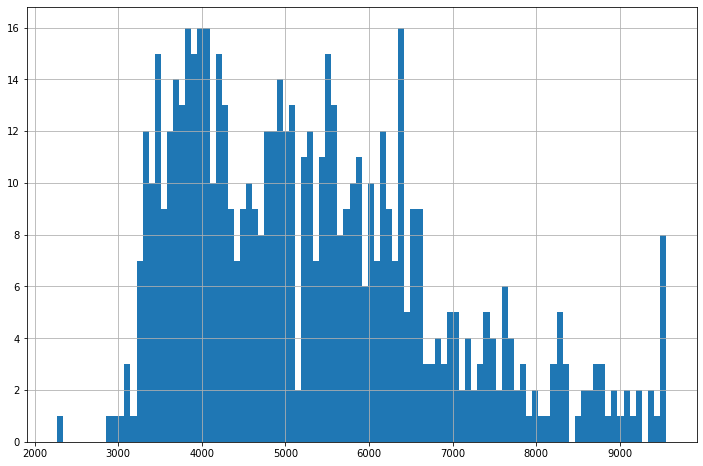

In [1038]:
# distribution of Sales density 
store_tsdf[8]['Sales'].hist(bins= 100)
plt.show()

Observation:
- Most of the sales value lies between 3000 to 6000.
- Sales peak are at 4000 and 4600 around. 

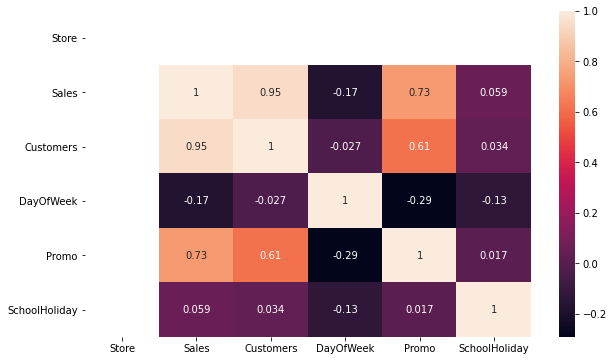

In [1039]:
# analyse correlation

plt.figure(figsize=[10,6])
sns.heatmap(store_tsdf[8].corr(),annot=True)
plt.show()

Obsevation:
- Very high correlation between Sales and Customers
- Good correlation between Promo and Sales.

#### Decompostion of time series Data 

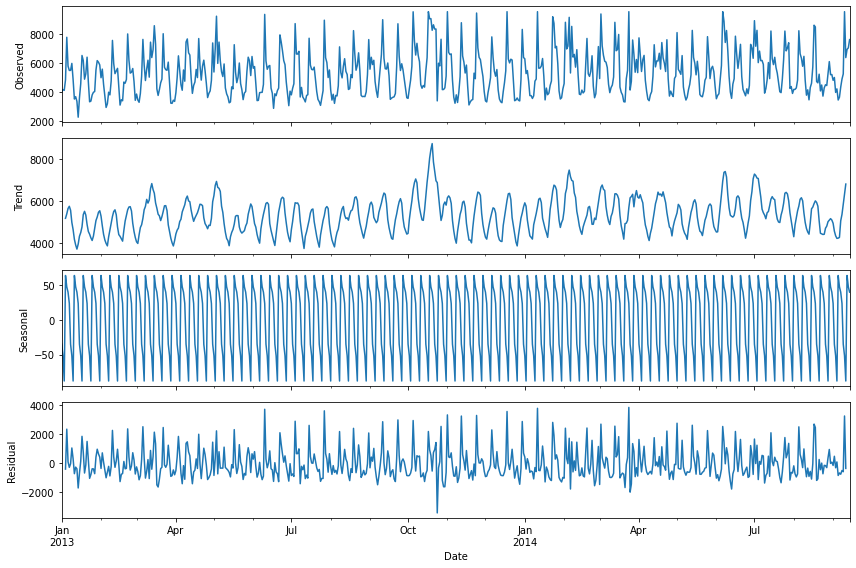

In [1040]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize']  =12,8
decomposition = sm.tsa.seasonal_decompose(store_tsdf[8]['Sales'],model = 'additive')
fig = decomposition.plot()
plt.show()

### Data preparation

#### Split the time series data into test and train

In [1041]:
# first two and half years as training set
# last six weeks as test set (means 42 days)
len(store_tsdf[8])

622

In [1042]:

train = store_tsdf[8][['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][:-42]
test = store_tsdf[8][['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][-42:]

In [1043]:
# inspect test and train 
len(train), len(test)

(580, 42)

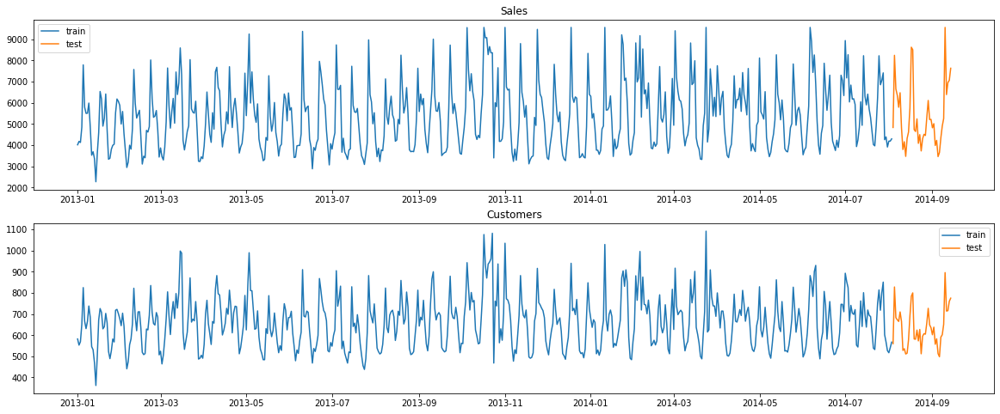

In [1044]:
plt.figure(figsize = (20,8))
plt.subplot(211)
plt.plot(train['Sales'],label = 'train')
plt.plot(test['Sales'], label = 'test')
plt.title('Sales')
plt.legend(loc = 'best')

plt.subplot(212)
plt.plot(train['Customers'],label = 'train')
plt.plot(test['Customers'],label = 'test')
plt.title('Customers')
plt.legend(loc = 'best')
plt.show()

#### Standardize the train data

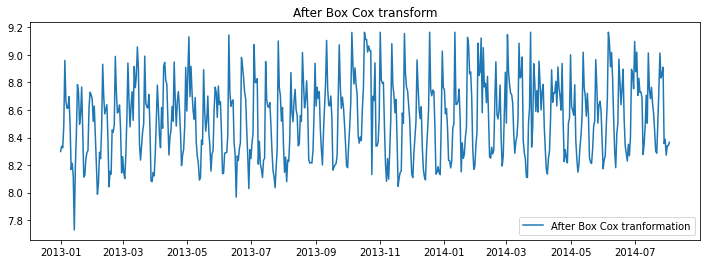

In [1045]:
from scipy.stats import boxcox
train_boxcox = pd.DataFrame(boxcox(train['Sales'], lmbda=0), index = train.index, columns=['Sales'])
train_boxcox['Customers'] =  pd.Series(boxcox(train['Customers'], lmbda=0), index = train.index)

# plotting Sales after boxcox transformation
plt.figure(figsize=(12,4))
plt.plot(train_boxcox['Sales'], label='After Box Cox tranformation')
plt.legend(loc='best')
plt.title('After Box Cox transform')
plt.show()

#### Check for Stationarity

In [1046]:
# Augmented Dickey Fuller test(ADF)
from statsmodels.tsa.stattools import adfuller

# Sales
adf_test = adfuller(train_boxcox['Sales'])

print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train_boxcox['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])


ADF Test for SALES
ADF Statistics: -5.364
Critical value @ 0.05: -2.87
p-value: 0.000004


ADF Test for CUSTOMERS
ADF Statistics: -5.286
Critical value @ 0.05: -2.87
p-value: 0.000006


In [1047]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test
from statsmodels.tsa.stattools import kpss
kpss_test = kpss(train_boxcox['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

kpss_test = kpss(train_boxcox['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 0.604493
Critical Values @ 0.05: 0.46
p-value: 0.022228


KPSS test for Customers
KPSS Statistic: 0.256748
Critical Values @ 0.05: 0.46
p-value: 0.100000


Observation:
- Sales Training dataset is found to be non stationary using KPSS test

#### Differenceing to remove trend 

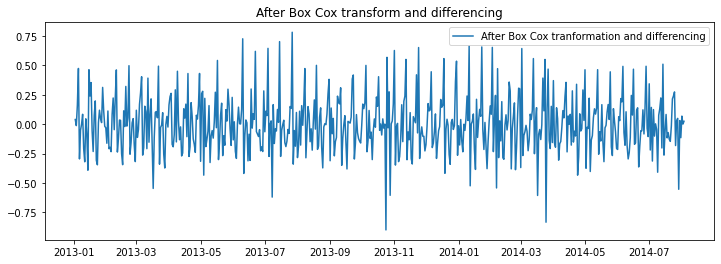

In [1048]:
train_boxcox_diff = pd.DataFrame(pd.Series(train_boxcox['Sales'] - train_boxcox['Sales'].shift(), train.index))
train_boxcox_diff['Sales'] = train_boxcox_diff
train_boxcox_diff['Customers'] = train_boxcox['Customers'] - train_boxcox['Customers'].shift()
train_boxcox_diff.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(train_boxcox_diff['Sales'], label='After Box Cox tranformation and differencing')
plt.legend(loc='best')
plt.title('After Box Cox transform and differencing')
plt.show()

#### Check for stationarity after differencing

In [1049]:
# Augmented Dickey Fuller test(ADF)
from statsmodels.tsa.stattools import adfuller

# Sales
adf_test = adfuller(train_boxcox_diff['Sales'])

print("ADF Test for SALES")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

# Customers
adf_test = adfuller(train_boxcox_diff['Customers'])
print("\n")
print("ADF Test for CUSTOMERS")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.05: %.2f' % adf_test[4]['5%'])
print('p-value: %f' % adf_test[1])

ADF Test for SALES
ADF Statistics: -10.885
Critical value @ 0.05: -2.87
p-value: 0.000000


ADF Test for CUSTOMERS
ADF Statistics: -10.430
Critical value @ 0.05: -2.87
p-value: 0.000000


In [1050]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test
from statsmodels.tsa.stattools import kpss
kpss_test = kpss(train_boxcox_diff['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

kpss_test = kpss(train_boxcox_diff['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 0.023582
Critical Values @ 0.05: 0.46
p-value: 0.100000


KPSS test for Customers
KPSS Statistic: 0.022305
Critical Values @ 0.05: 0.46
p-value: 0.100000


Observation :
- Now the training dataset is stationary.

### Model Building

#### AutoCorrelation function

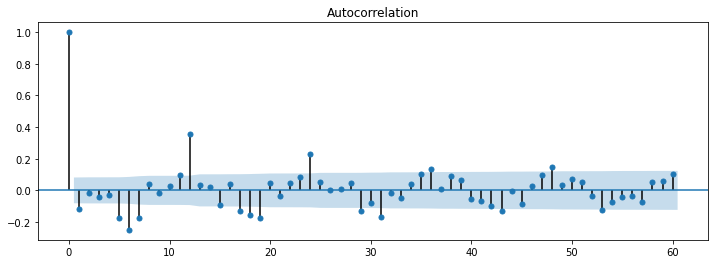

In [1051]:
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12,4))
plot_acf(train_boxcox_diff['Sales'], ax=plt.gca(), lags = 60)
plt.show()

#### Partial AutoCorrelation function.

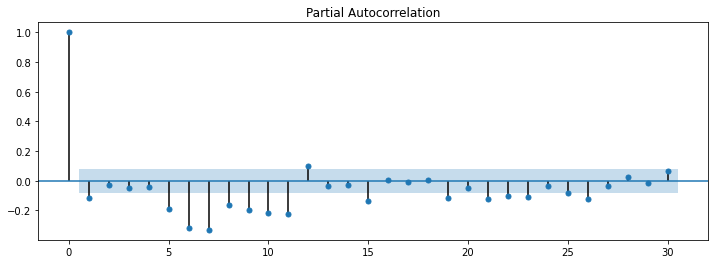

In [1052]:
from statsmodels.graphics.tsaplots import plot_pacf
plt.figure(figsize=(12,4))
plot_pacf(train_boxcox_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

#### ARIMA MODEL

In [1053]:
model = ARIMA(train_boxcox_diff['Sales'], order=(11,0,1))
model_fit = model.fit()
print(model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  579
Model:                    ARMA(11, 1)   Log Likelihood                 130.159
Method:                       css-mle   S.D. of innovations              0.193
Date:                Mon, 12 Apr 2021   AIC                           -232.319
Time:                        17:47:05   BIC                           -171.261
Sample:                    01-02-2013   HQIC                          -208.512
                         - 08-03-2014                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0001      0.002      0.082      0.934      -0.003       0.003
ar.L1.Sales     -0.9482      0.175     -5.426      0.000      -1.291      -0.606
ar.L2.Sales     -0.5862      0.085     -6.88

##### Recover the orginal time series

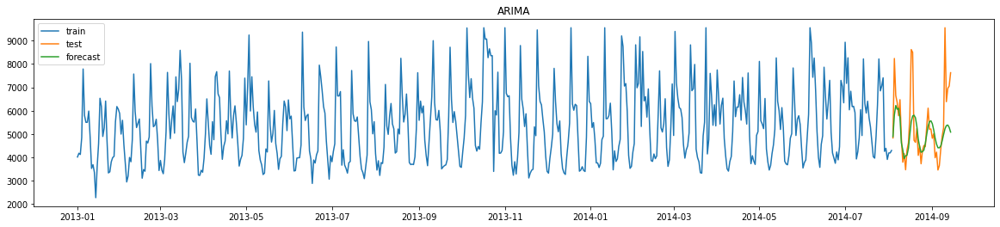

In [1054]:
y_hat_ar = store_tsdf[8]['Sales'].copy()
y_hat_ar['ar_forecast_boxcox_diff'] = model_fit.predict(start = test.index.min(), end = test.index.max())
y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox_diff'].cumsum()
y_hat_ar['ar_forecast_boxcox'] = y_hat_ar['ar_forecast_boxcox'].add(train_boxcox['Sales'][0])
y_hat_ar['ar_forecast'] = np.exp(y_hat_ar['ar_forecast_boxcox'])

graph(y_hat_ar['ar_forecast'],"ARIMA")

##### Calculate RMSE and MAPE

In [1055]:
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_ar['ar_forecast'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_ar['ar_forecast'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_46_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Check for granger Causality Test

In [1056]:
grangers_causality_matrix(train,variables = train.columns)

,Sales_x,Customers_x,DayOfWeek_x,Promo_x,SchoolHoliday_x,StateHoliday_x
Sales_y,1.0000,0.0000,0.0,0.0000,0.0,1.0
Customers_y,0.0000,1.0000,0.0,0.0000,0.0,1.0
DayOfWeek_y,0.0000,0.0000,1.0,0.0000,0.0,1.0
Promo_y,0.0000,0.0000,0.0,1.0000,0.0,1.0
SchoolHoliday_y,0.0826,0.0175,0.0,0.0011,1.0,1.0
StateHoliday_y,NaN,NaN,NaN,NaN,NaN,NaN


#### VAR model

In [1057]:

mod = sm.tsa.VARMAX(train_boxcox_diff[['Sales', 'Customers']], order=(11,0), trend='n')
res = mod.fit(maxiter=1000, disp=False)
print(res.summary())
#Note the AIC value - lower AIC => better model

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  579
Model:                            VAR(11)   Log Likelihood                1144.234
Date:                    Mon, 12 Apr 2021   AIC                          -2194.468
Time:                            17:47:45   BIC                          -1989.487
Sample:                        01-02-2013   HQIC                         -2114.546
                             - 08-03-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                56.77, 37.36   Jarque-Bera (JB):          81.75, 8.70
Prob(Q):                        0.04, 0.59   Prob(JB):                   0.00, 0.01
Heteroskedasticity (H):         1.12, 1.35   Skew:                       0.12, 0.27
Prob(H) (two-sided):            0.42, 0.04   Kurtosis:                   4.83, 3.26


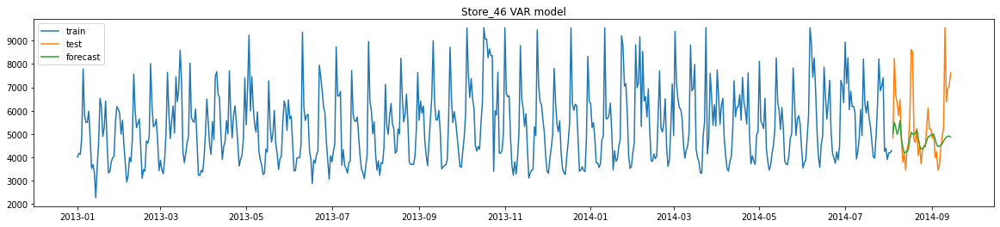

In [1058]:

start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_var = mod.fit().predict(start=start_index, end=end_index)
y_hat_var['Sales'] = y_hat_var['Sales'].cumsum()
y_hat_var['Sales'] = y_hat_var['Sales'].add(train_boxcox['Sales'][0])
y_hat_var['Sales'] = np.exp(y_hat_var['Sales'])

graph(y_hat_var['Sales'],"Store_46 VAR model")


In [1059]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'])).round(2)
#print('Income: RMSE:',  rmse)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_var['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_var['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_46_VAR'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results



,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


#### Johansen cointegration Test

In [1060]:
coint=coint_johansen(np.asarray(train_boxcox[['Sales','Customers']]),0,1)
# coint.trace_stat
# coint.max_eig_stat
traces = coint.lr1
maxeig=coint.lr2
cvts = coint.cvt  ## 0: 90%  1:95% 2: 99%
cvms = coint.cvm   ## 0: 90%  1:95% 2: 99%

N, l = np.asarray(train[['Sales','Customers']]).shape

for i in range(l):
    if traces[i] > cvts[i, 1]:
        r = i + 1
print(r)

2


Observation:
- No cointgeration
- Both series are stationary

#### VARMAX

In [1061]:
exog = train['SchoolHoliday']
mod_varmax = sm.tsa.VARMAX(train_boxcox_diff[['Sales', 'Customers']],exog= exog[1:], order=(11,1), trend='c')
resmax = mod_varmax.fit(maxiter=1000, disp=False)
print(resmax.summary())

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  579
Model:                       VARMAX(11,1)   Log Likelihood                1154.142
                              + intercept   AIC                          -2198.285
Date:                    Mon, 12 Apr 2021   BIC                          -1958.413
Time:                            17:53:41   HQIC                         -2104.759
Sample:                        01-02-2013                                         
                             - 08-03-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                44.71, 37.72   Jarque-Bera (JB):         137.93, 5.38
Prob(Q):                        0.28, 0.57   Prob(JB):                   0.00, 0.07
Heteroskedasticity (H):         1.15, 1.38   Skew:                      -0.16, 0.21
P

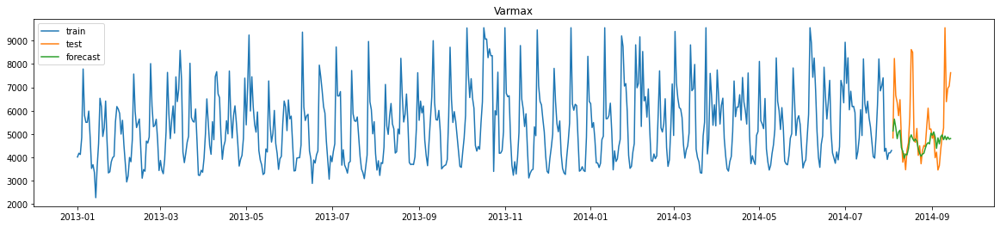

In [1062]:

# forecast
start_index = test['Sales'].index.min()
end_index = test['Sales'].index.max()
y_hat_varmax = pd.DataFrame()
y_hat_varmax[["Sales_boxcox_diff",'Customers_boxcox_diff']] = resmax.predict(start=start_index, end=end_index,exog = np.array(exog[-42:]).reshape(42,1))
y_hat_varmax['Sales_boxcox'] = y_hat_varmax['Sales_boxcox_diff'].cumsum()
y_hat_varmax['Sales_boxcox'] = y_hat_varmax['Sales_boxcox'].add(train_boxcox['Sales'][0])
y_hat_varmax['Sales'] = np.exp(y_hat_varmax['Sales_boxcox'])

graph(y_hat_varmax['Sales'],"Varmax")


#### Evaluation

In [1063]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'])).round(2)
#print('Income: RMSE:',  rmse)

rmse = np.sqrt(mean_squared_error(test['Sales'], y_hat_varmax['Sales'][test.index.min():])).round(2)
mape = np.round(np.mean(np.abs(test['Sales']-y_hat_varmax['Sales'][test.index.min():])/test['Sales'])*100,2)

tempResults = pd.DataFrame({'Method':['Store_46_VARMAX_SchoolHoliday'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


In [1064]:
results

,Method,MAPE,RMSE
0,Store_1_ARIMA,11.88,593.71
0,Store_1_VAR,20.94,1227.40
0,Store_1_VARMAX_SchoolHoliday,14.38,719.53
0,Store_3_ARIMA,24.04,2038.64
0,Store_3_VAR,23.16,2135.31
0,Store_3_VARMAX_SchoolHoliday,22.39,1971.16
0,Store_8_ARIMA,19.99,1391.43
0,Store_8_VAR,26.43,2112.57
0,Store_8_VARMAX_SchoolHoliday,25.83,2260.98
0,Store_9_ARIMA,19.26,2231.56


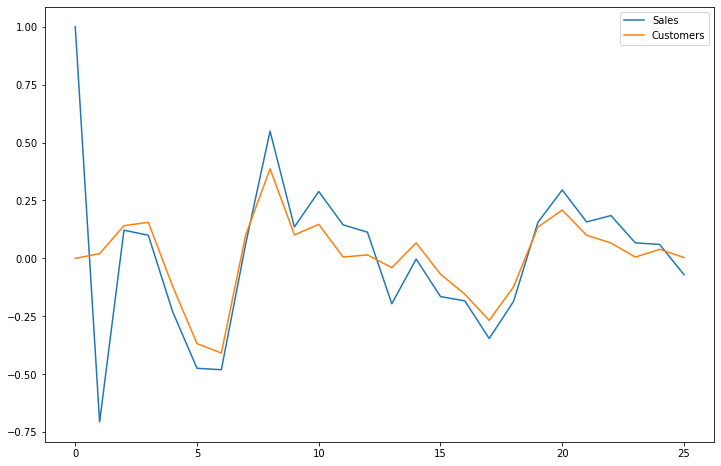

In [1065]:
#Impulse Response function
irf = resmax.impulse_responses(steps = 25, orthogonalized= False)
irf.plot()

## Conclusion:
The MAPE value has been evaluated MAPE value for different model of each stores.It is observed that VARMAX model has performed better than other models for most of the case with few case where ARIMA model supercedes both. The exogenous variable test were 'PROMO, SchoolHoliday','DayOfWeek. Out of which 'SchoolHoliday' has outperformed the other two variables. <br>

The sales could be strategies with holidays of School.
